Mahendra Nandi \
OptAl \
Assignment (on GD, SGD, Mini batch GD, Momentum, SGD with momentum, Nesterov accelerated gradient) \
Date: 14/06/2021


Question:2:
Minimize the function $\large f(x_1, x_2) =  x_1^2 + 2 x_2^2$ by stochastic gradient method. To simulate a
stochastic gradient, add normal (white) noise to the exact gradient at each step (this method is called
perturbed GD). 
ru
* [A] First use piecewise constant step size ($ η(t) = η_i, t_i ≤ t ≤ t_{i+1} $, starting with $ η = 0.1 $)  - i.e., decrease the step size whenever progress in optimization stalls. Next use two types of Dynamic Learning Rates -

* [B] (i) exponential decay   $ η(t) = η_0e^{−λt} $      , using $ η_0 = 0.1, λ = 0.1 $ 

* [B] (ii) polynomial decay   $η(t) = η_0(1 + βt)−α $  , using $ η_0 = 0.1, α = 0.5$. You have to find a good value for β. 

Compare the result of using three different step size rules in terms of convergence rate, accuracy, number of steps required etc. and show relevant plots.

* [C]  **Now suppose the function is changed to  $ \large f(x_1, x_2) =  x_1^2 -2 x_2^2$. What changes do you observe in the outcome
of optimization?**

# <span class="burk">simulation of stocastic gradient descent</span>

## Functions defined

In [5]:
def plot_3D_plot(result,Function):
    lower_x=-4
    higher_x=max(result[0])+2
    lower_y=-4
    higher_y=max(result[1])+2
    a=np.linspace(lower_x,higher_x,100)
    b=np.linspace(lower_y,higher_y,100)
    c,d=np.meshgrid(a,b)
    z=Function((c,d))
    plt.figure(figsize=(10,10))
    ax=plt.axes(projection="3d")
    
    ax.plot_wireframe(c,d,z,rstride=10, cstride=5,cmap="gray")#,color="gray"),
    # ax.contour3D(c,d,z,100,cmap="viridis"),
    ax.view_init(60,40),
    ax.plot3D(result[0],result[1],result[2],"b*-", linewidth=4),
    ax.plot3D(0,0,0,"r*-", markersize=10),
    # ax.scatter(result[0],result[1],result[2], c='red', s=100),
    ax.set_xlabel("$x_1$",fontdict={ "fontsize": 20 , "color": "blue" }),
    ax.set_ylabel("$x_2$",fontdict={ "fontsize": 20 , "color": "blue" }),
    ax.set_zlabel("$ f(x_1,x_2)$",fontdict={ "fontsize": 20 , "color": "blue" }),
    ax.set_title("$ f(x_1, x_2) =  x_1^2 +2 x_2^2 $ function and \ntracking the path throuth the surface",fontdict={ "fontsize": 20 , "color": "blue" , "horizontalalignment":"center"}),

    
    return plt.show()

In [6]:
def all_7_plots(result,Function):
    plt.figure(figsize=(12,12))
    
    plt.subplot(321)
    plt.plot(result[0],".-",label="$x_1$ value")
    plt.plot(result[1],".-",label="$x_2$ value")
    plt.title("$x_1$ value and ,$x_2$ value with iterations")
    plt.xlabel("iteration")
    plt.ylabel("$x_1$ and $x_2$ values")
    plt.legend()

    plt.subplot(322)
    plt.plot(result[3])
    plt.title(" $\eta$ value with iterations")
    plt.xlabel("iteration")
    plt.ylabel("values of $\eta$") 

    plt.subplot(323)
    plt.plot(result[2])
    plt.title("function value with iterations")
    plt.xlabel("iteration")
    plt.ylabel("function values")

    plt.subplot(324)
    if len(result[2])<50:
        last=np.int(len(result[2])/2)
    else:
        last=np.int(len(result[2])/10)
    plt.plot(result[2][-last:])
    plt.title("function value for last {} iterations".format(last))
    plt.xlabel("iteration")
    plt.ylabel("function values")


    plt.subplot(325)
    plt.plot(result[4])
    plt.title("gradient value with iterations")
    plt.xlabel("iteration")
    plt.ylabel("gradient norm values")

    plt.subplot(326)
    lower_x=-4
    higher_x=max(result[0])+2
    lower_y=-4
    higher_y=max(result[1])+2
    a=np.linspace(lower_x,higher_x,100)
    b=np.linspace(lower_y,higher_y,100)
    c,d=np.meshgrid(a,b)
    z=Function((c,d))
    plt.contour(c,d,z,50)
    plt.plot(result[0],result[1])
    plt.plot(0,0,"r*")
    plt.title("trajectory in contour plot")
    plt.xlabel("$x_1$")
    plt.ylabel("$x_2$")

    plt.subplots_adjust(left=0.01,bottom=0.1, right=0.9, top=0.9, wspace=0.3, hspace=0.3)
    
    plot_3D_plot(result,Function)
    return plt.show()

In [7]:
# Required Libraries 
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits import mplot3d
%matplotlib inline 

def Function(X):
    x1=X[0]
    x2=X[1]
    return x1**2 +2*(x2**2)
def Gradient(X):
    x1=X[0]
    x2=X[1]
    return np.asarray([2*x1 , 4*x2])

# Visualizations for the function $\large f(x_1, x_2) =  x_1^2 +2 x_2^2$

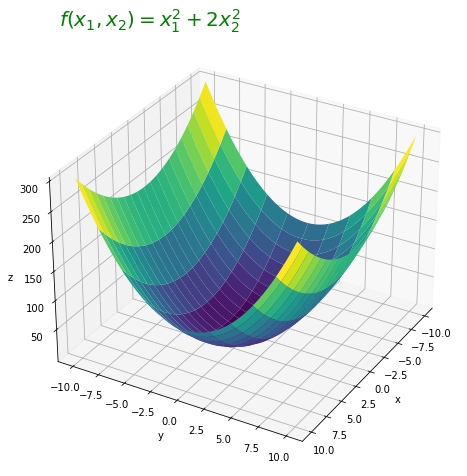

In [9]:
a=b=np.linspace(-10,10,100)
c,d=np.meshgrid(a,b)
z=Function((c,d))

plt.figure(figsize=(8,8))
ax=plt.axes(projection="3d")
ax.plot_surface(c,d,z,cstride=5,cmap="viridis")
ax.set_xlabel("x")
ax.set_ylabel("y")
ax.set_zlabel("z")
ax.set_title("$ f(x_1, x_2) =  x_1^2 +2 x_2^2 $ ",fontdict={ "fontsize": 20 , "color": "green" , "horizontalalignment":"right"})
ax.view_init(30,30)

## Four different function for different function

In [10]:
## Four different function for different function

def perturbed_GD_constant_lr(F,G,X,eta=0.1,max_iteration=1000,Std_Norm_Noise=True,how_close_to_minima=0.001):
    function_values_list=[Function(X)]
    x1_values_list=[X[0]]
    x2_values_list=[X[1]]
    eta_values_list=[eta]
    
    iteration=0
    print("Noise Added With Gradient from : the "'standard normal'" distribution. ")
    while (iteration<= max_iteration):
        if np.linalg.norm(F(X)-np.asarray([0,0]))>how_close_to_minima:
#         if (G(X)!=[0,0]).all() :
            iteration+=1
            if Std_Norm_Noise==True:
                noise=np.random.randn(2)
            else:
                [[grad_x1_noise,grad_x2_noise]] = np.random.normal(0,0.1, size=(1,2))
                noise= np.asarray((grad_x1_noise),(grad_x2_noise))
            X-= eta*(G(X) + noise)
            x1_values_list.append(X[0])
            x2_values_list.append(X[1])
            function_values_list.append(Function(X))
        else:
            break
    if iteration< max_iteration:
        print("\nTotal iteration nedded is   {}   which is less than the maximum iteration({})\n".format(iteration,max_iteration))
    if iteration>max_iteration:
        print("\nMaximum iteration({}) reached but minimum is not reached.Follow the curves below and decide whether you should increase max_iteration further or not\n".format(max_iteration))
    return x1_values_list , x2_values_list ,function_values_list, eta_values_list

def perturbed_GD_piecewise_decayed_lr(F,G,X,eta=0.1,max_iteration=2000,Std_Norm_Noise=True,how_close_to_minima=0.001):
    function_values_list=[Function(X)]
    x1_values_list=[X[0]]
    x2_values_list=[X[1]]
    eta_values_list=[eta]
    grad_values_list=[]
    iteration=0
    while (iteration<= max_iteration):
        if np.linalg.norm(F(X)-np.asarray([0,0]))>how_close_to_minima:
#         if (G(X)!=[0,0]).all() :
            iteration+=1
            if Std_Norm_Noise==True:
                noise=np.random.randn(2)
            else:
                [[grad_x1_noise,grad_x2_noise]] = np.random.normal(0,0.1, size=(1,2))
                noise= np.asarray((grad_x1_noise),(grad_x2_noise))
            X-= eta*(G(X) + noise) 
            grad_values_list.append(np.linalg.norm(G(X)))
            x1_values_list.append(X[0])
            x2_values_list.append(X[1])
            function_values_list.append(Function(X))
        else:
            break 
        if F([x1_values_list[-1],x2_values_list[-1]])-F([x1_values_list[-2],x2_values_list[-2]]) >0:
            eta=eta/2
        eta_values_list.append(eta)
    if iteration< max_iteration:
        print("\nTotal iteration nedded is   {}   which is less than the maximum iteration({})\n".format(iteration,max_iteration))
    if iteration>max_iteration:
        print("\nMaximum iteration({}) reached. Please increase the iteration to get more accurate result\n".format(max_iteration))
    return x1_values_list , x2_values_list ,function_values_list, eta_values_list ,grad_values_list



def perturbed_GD_exponentially_decayed_lr(F,G,X,max_iteration=2000,lamda=0.1,eta_0=0.1,Std_Norm_Noise=True,how_close_to_minima=0.001):
    function_values_list=[Function(X)]
    x1_values_list=[X[0]]
    x2_values_list=[X[1]]
    eta_values_list=[]
    grad_values_list=[]
    iteration=0
    while (iteration<= max_iteration):
        eta= eta_0 * np.exp(-lamda*iteration)
        eta_values_list.append(eta)
        if np.linalg.norm(F(X)-np.asarray([0,0]))>how_close_to_minima:
#         if (G(X)!=[0,0]).all() :
            iteration+=1
            if Std_Norm_Noise==True:
                noise=np.random.randn(2)
            else:
                [[grad_x1_noise,grad_x2_noise]] = np.random.normal(0,0.1, size=(1,2))
                noise= np.asarray((grad_x1_noise),(grad_x2_noise))
            X-= eta*(G(X) + noise)
            grad_values_list.append(np.linalg.norm(G(X)))
            x1_values_list.append(X[0])
            x2_values_list.append(X[1])
            function_values_list.append(Function(X))
        else:
            break
    if iteration< max_iteration:
        print("\nTotal iteration nedded is   {}   which is less than the maximum iteration({})\n".format(iteration,max_iteration))
    if iteration>max_iteration:
        print("\nMaximum iteration({}) reached. Please increase the iteration to get more accurate result\n".format(max_iteration))
    return x1_values_list , x2_values_list ,function_values_list, eta_values_list ,grad_values_list


def perturbed_GD_polynomially_decayed_lr(F,G,X,bita=0.01,eta_0=0.1,alpha=0.5,max_iteration=1500,Std_Norm_Noise=True,how_close_to_minima=0.001):
    function_values_list=[Function(X)]
    x1_values_list=[X[0]]
    x2_values_list=[X[1]]
    eta_values_list=[]
    grad_values_list=[]
    iteration=0
    while (iteration<= max_iteration):
        eta=eta_0*(1+bita*iteration)**(-alpha)
        eta_values_list.append(eta)
        if np.linalg.norm(F(X)-np.asarray([0,0]))>how_close_to_minima:
#         if (G(X)!=[0,0]).all() :
            iteration+=1
            if Std_Norm_Noise==True:
                noise=np.random.randn(2)
            else:
                [[grad_x1_noise,grad_x2_noise]] = np.random.normal(0,0.1, size=(1,2))
                noise= np.asarray((grad_x1_noise),(grad_x2_noise))
            X-= eta*(G(X) + noise)
            grad_values_list.append(np.linalg.norm(G(X)))
            x1_values_list.append(X[0])
            x2_values_list.append(X[1])
            function_values_list.append(Function(X))
        else:
            break
    if iteration< max_iteration:
        print("\nTotal iteration nedded is   {}   which is less than the maximum iteration({})\n".format(iteration,max_iteration))
    if iteration>max_iteration:
        print("\nMaximum iteration({}) reached. Please increase the iteration to get more accurate result\n".format(max_iteration))
    return x1_values_list , x2_values_list ,function_values_list, eta_values_list ,grad_values_list 


## All 4 methods are applyed in one function


eta= learning rate we have to update in different method\
LR= Learning Rate ( eta or η )\
exp=exponentiall       \
poly=polynomial            \
pcwise=piecewise\
max_iteration= maximum iteration allowed \
Std_Norm_Noise = True  =>    Noise taken from standard normal distribution [N(0,1)]\
how_close_to_minima=0.001 => when the algorithm is 0.001 unit close to the minimum poin we are stopping it 


In [33]:
## All 4 methods are applyed in one function

def perturbed_GD(X,method,F=Function,G=Gradient,bita=0.1,eta_0=0.1,alpha=0.5,lamda=0.1,max_iteration=1000,Std_Norm_Noise=True,how_close_to_minima=0.001):
    function_values_list=[F(X)]
    x1_values_list=[X[0]]     # values of x coordinate
    x2_values_list=[X[1]]     # values of y coordinate
    eta_values_list=[]        # values of eta ,i.e, Learning Rate of GD
    grad_values_list=[]       # norm values of Gradient at the current point
    eta=eta_0
    iteration=0
    print("The method used is: {}".format(method))
    while (iteration<= max_iteration): 
        if np.linalg.norm(F(X)-np.asarray([0,0]))>how_close_to_minima:
            iteration+=1
            if Std_Norm_Noise==True:       # if noise is taken from N(0,1)
                noise=np.random.randn(2)
            else:                          # if noise is taken from N(0,0.1) and >0
                [[grad_x1_noise,grad_x2_noise]] = np.random.normal(0,0.1, size=(1,2))
                noise= np.asarray(np.abs(grad_x1_noise),np.abs(grad_x2_noise))
            X-= eta*(G(X) + noise)
            grad_values_list.append(np.linalg.norm(G(X)))
            x1_values_list.append(X[0])
            x2_values_list.append(X[1])
            function_values_list.append(Function(X))
        else:
            break
        
        if method=="constant":         # if eta is not changing throughout the iterations
            eta=eta
        if method=="pcwise":           # if eta is decreasing when the function value is increasing 
            if F([x1_values_list[-1],x2_values_list[-1]])-F([x1_values_list[-2],x2_values_list[-2]]) >0:
                eta=eta/2
        if method=="exp":              # if eta is decreasing exponentially  
            eta= eta_0 * np.exp(-lamda*iteration)
        if method=="poly":             # if eta is decreasing polynomially
            eta=eta_0*(1+bita*iteration)**(-alpha)
            
        eta_values_list.append(eta)
        
        
    if iteration< max_iteration:
        print("\nTotal iteration nedded is   {}   which is less than the maximum iteration({})\n".format(iteration,max_iteration))
    if iteration>max_iteration:
        print("\nMaximum iteration({}) reached. As you made it stochastic it might not reach the minimum\n".format(max_iteration))
    return x1_values_list , x2_values_list ,function_values_list, eta_values_list ,grad_values_list 


## 1(a) when LR is constant  and noise fron N(0,1)

The method used is: constant

Total iteration nedded is   33   which is less than the maximum iteration(1000)



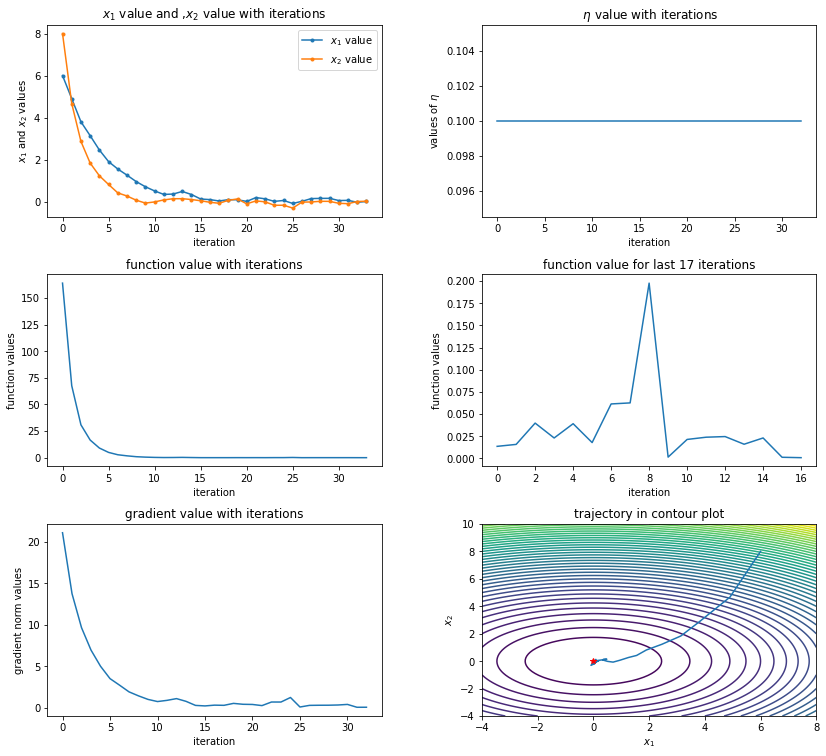

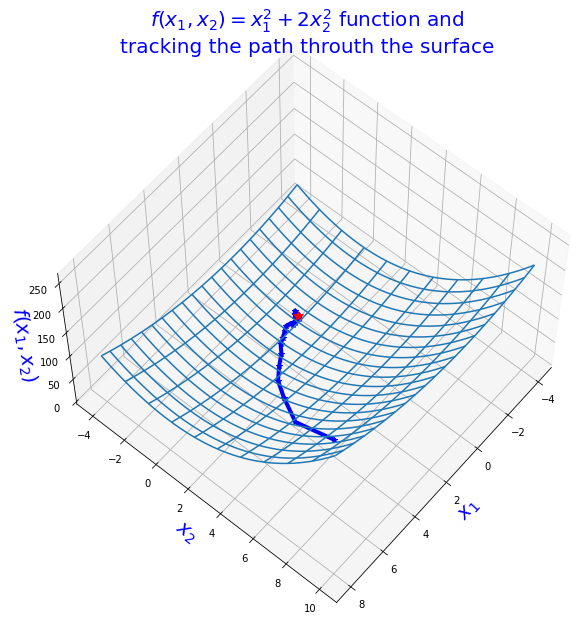

In [34]:
result_1a=perturbed_GD([6,8],"constant")
all_7_plots(result_1a,Function)

## 1(b) when LR is constant  and noise fron +N(0,0.1)

The method used is: constant

Total iteration nedded is   22   which is less than the maximum iteration(1000)



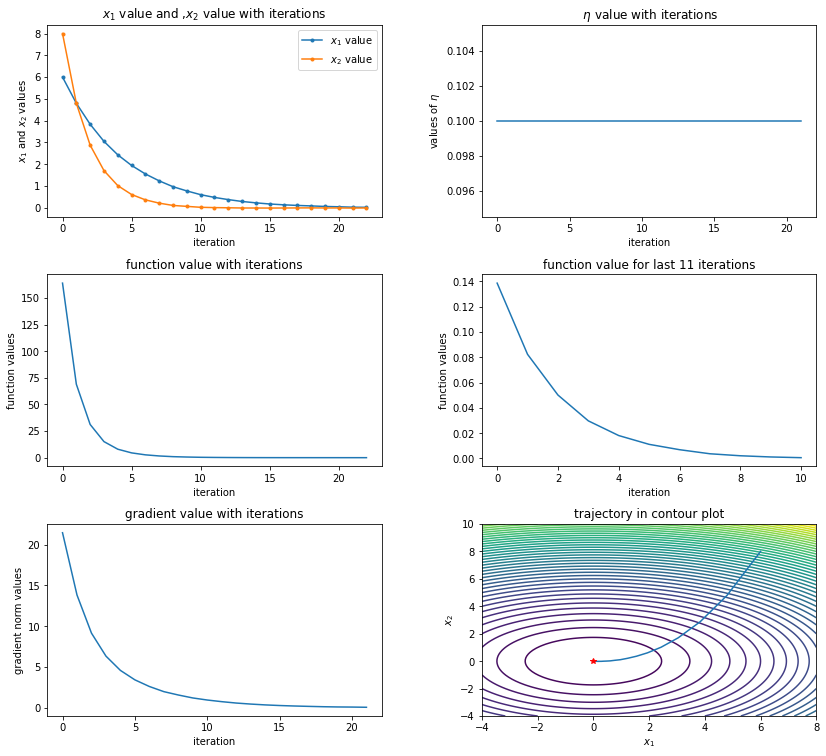

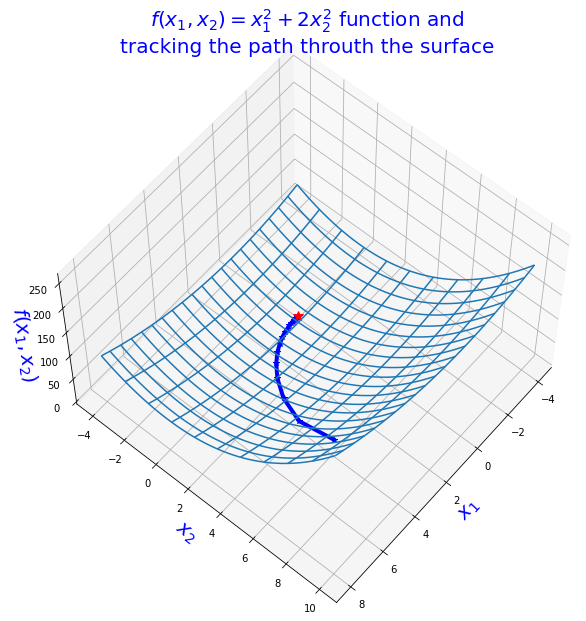

In [35]:
result_1b=perturbed_GD([6,8],"constant",Std_Norm_Noise=False)
all_7_plots(result_1b,Function)

## 2(a) when Lr is chaning $Peicewise$   with noise from N(0,1)

The method used is: pcwise

Maximum iteration(1000) reached. As you made it stochastic it might not reach the minimum



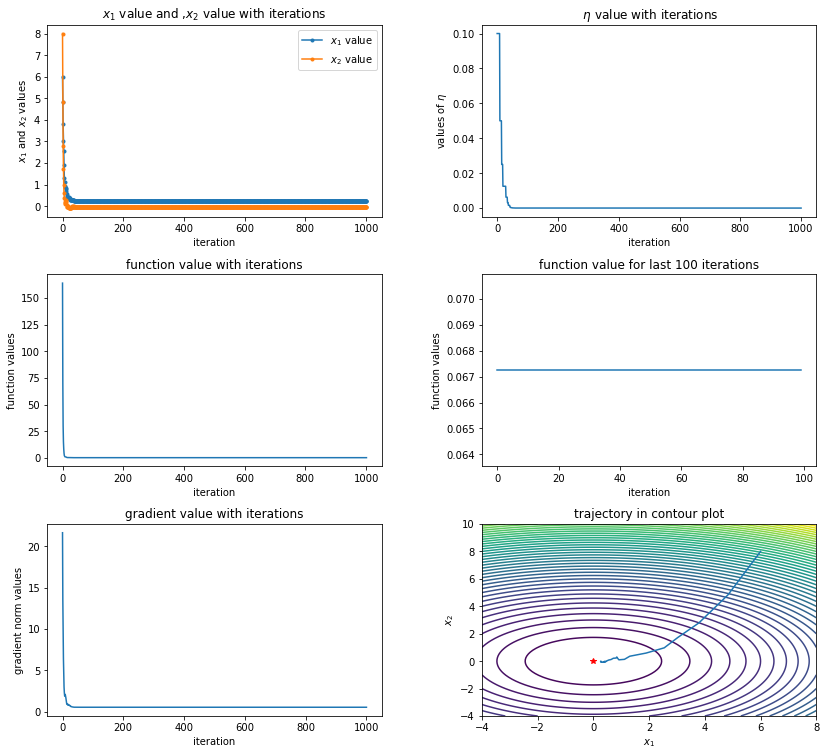

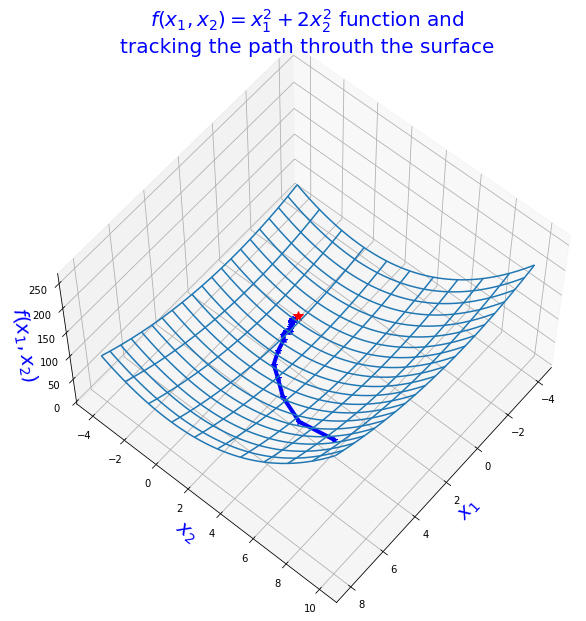

In [36]:
result_2a=perturbed_GD([6,8],"pcwise")
all_7_plots(result_2a,Function)

## 2(b) when Lr is chaning $Peicewise $  with noise from +N(0,0.1) 

The method used is: pcwise

Total iteration nedded is   23   which is less than the maximum iteration(1000)



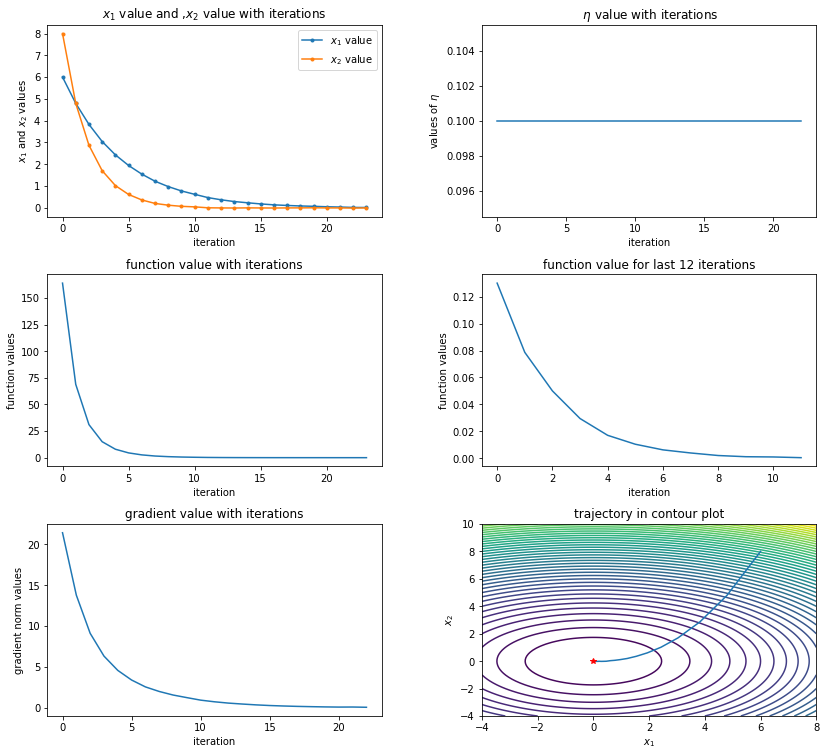

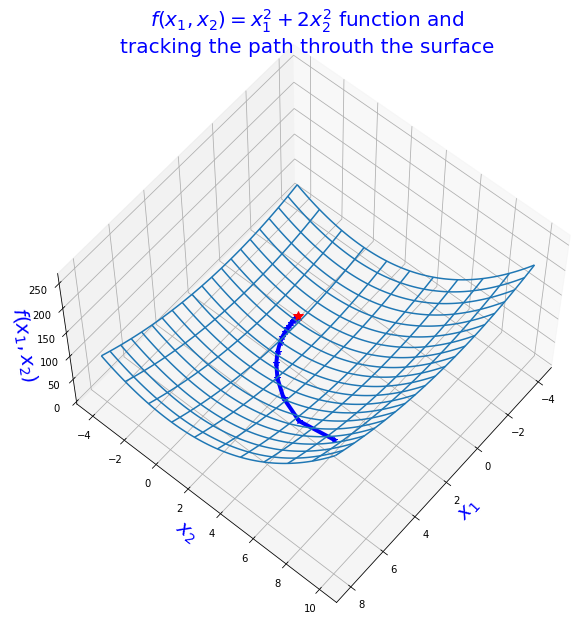

In [37]:
result_2b=perturbed_GD([6,8],"pcwise",Std_Norm_Noise=False)
all_7_plots(result_2b,Function)

## 3(a) when Lr is chaning $exponentially$ with noise from N(0,1)

The method used is: exp

Maximum iteration(1000) reached. As you made it stochastic it might not reach the minimum



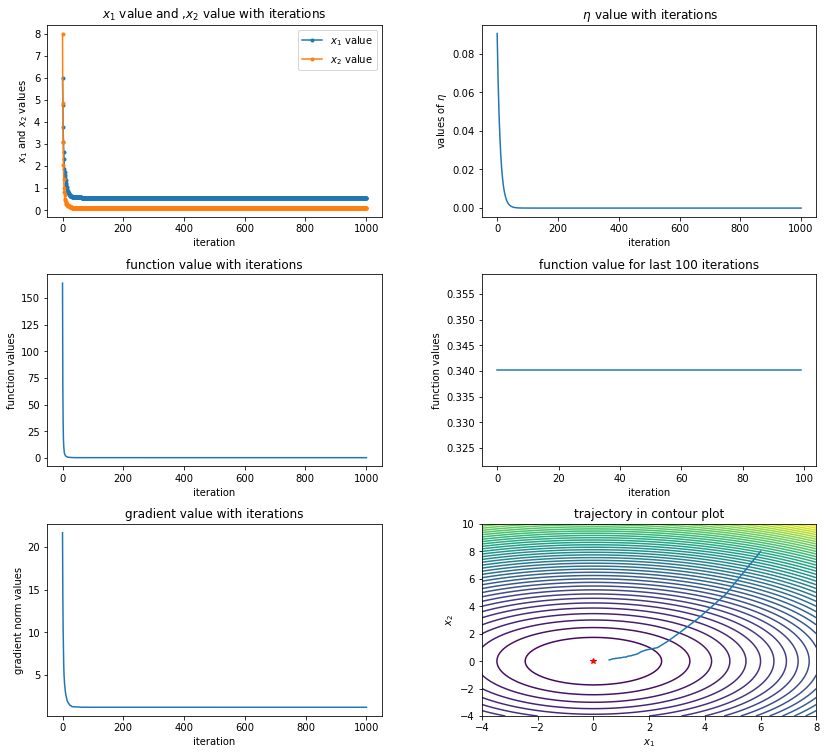

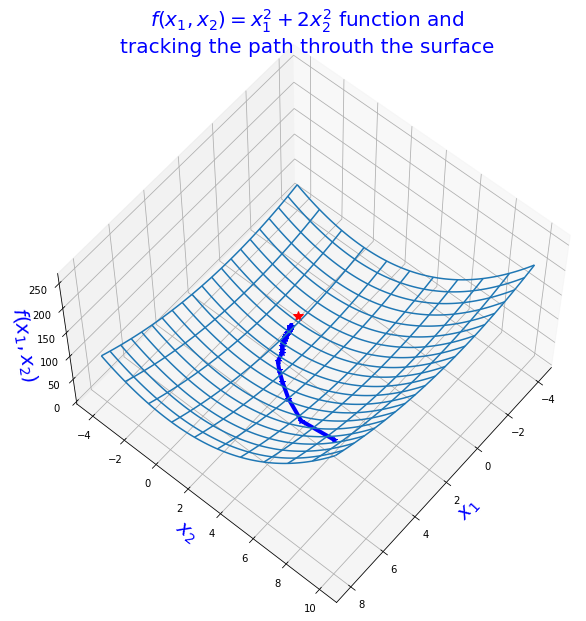

In [38]:
result_3b=perturbed_GD([6,8],"exp")
all_7_plots(result_3b,Function)

## 3(b) when Lr is chaning $exponentially$   with noise from +N(0,0.1) 

The method used is: exp

Maximum iteration(1000) reached. As you made it stochastic it might not reach the minimum



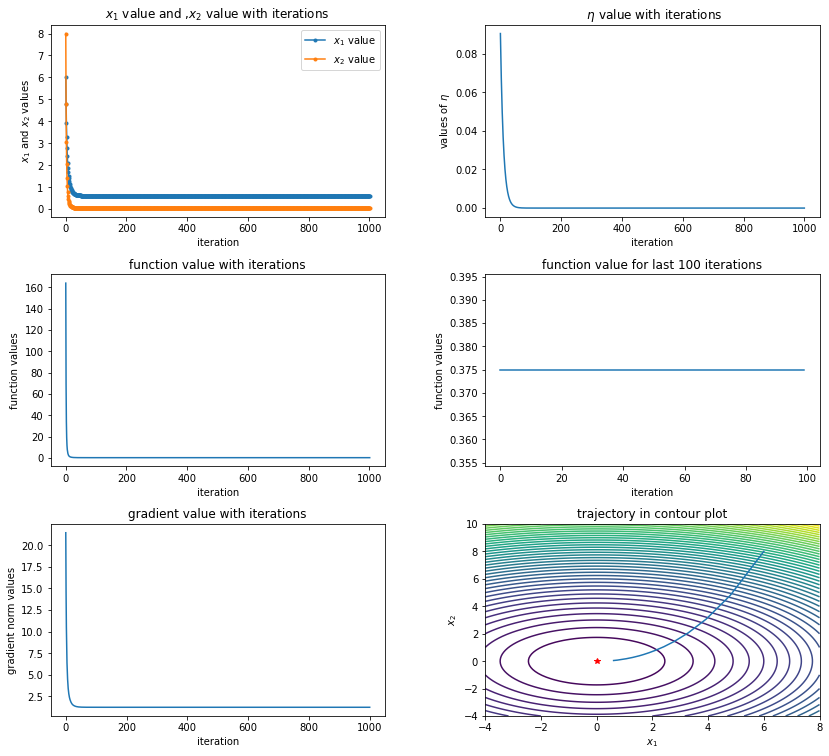

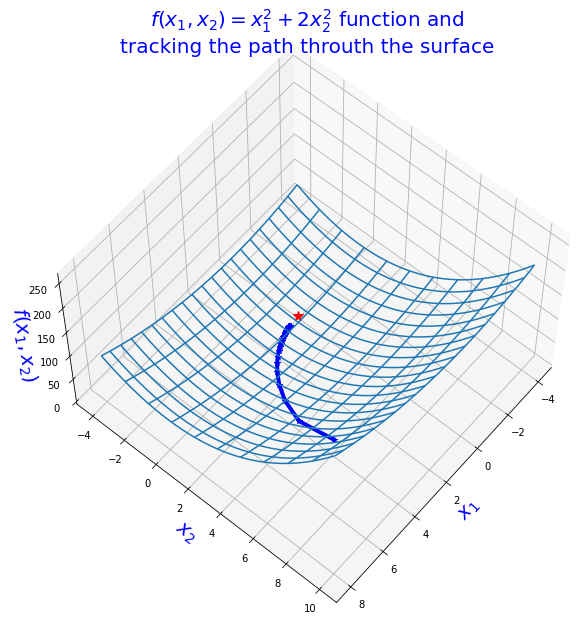

In [39]:
result_3b=perturbed_GD([6,8],"exp",Std_Norm_Noise=False)
all_7_plots(result_3b,Function)

## 4(a) when Lr is chaning $polynomially$   with noise from N(0,1)

The method used is: poly

Total iteration nedded is   70   which is less than the maximum iteration(1000)



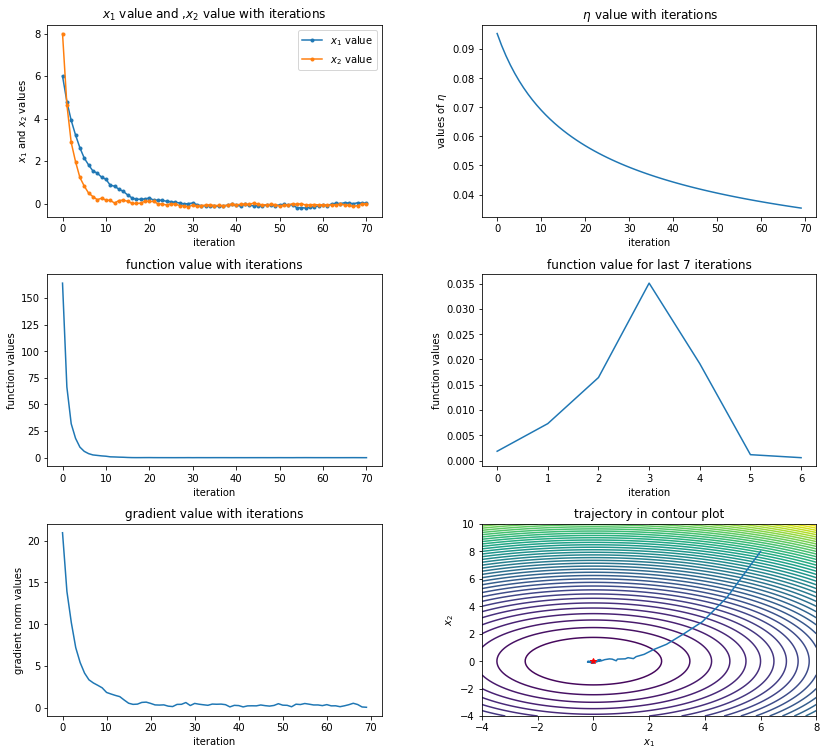

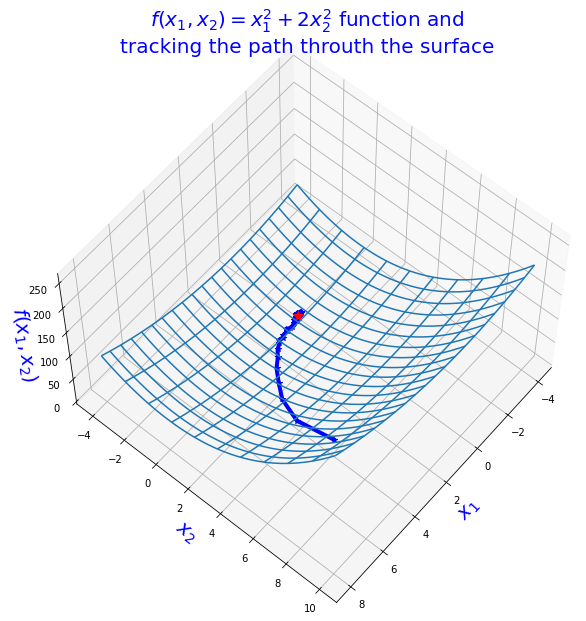

In [40]:
result_4b=perturbed_GD([6,8],"poly")
all_7_plots(result_4b,Function)

## 4(b) when Lr is chaning $polynomially$    with noise from +N(0,0.1) 

The method used is: poly

Total iteration nedded is   36   which is less than the maximum iteration(1000)



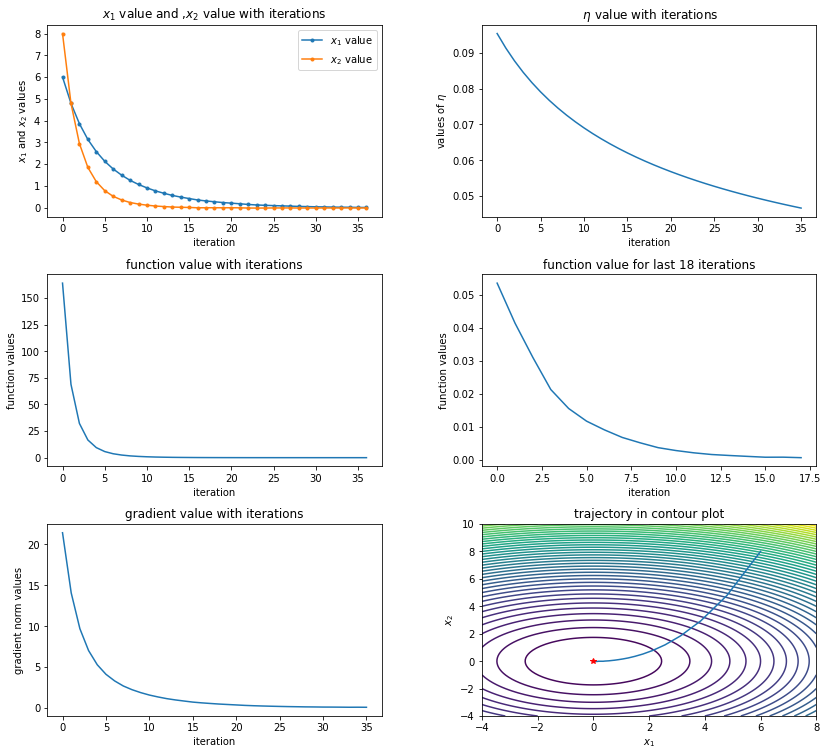

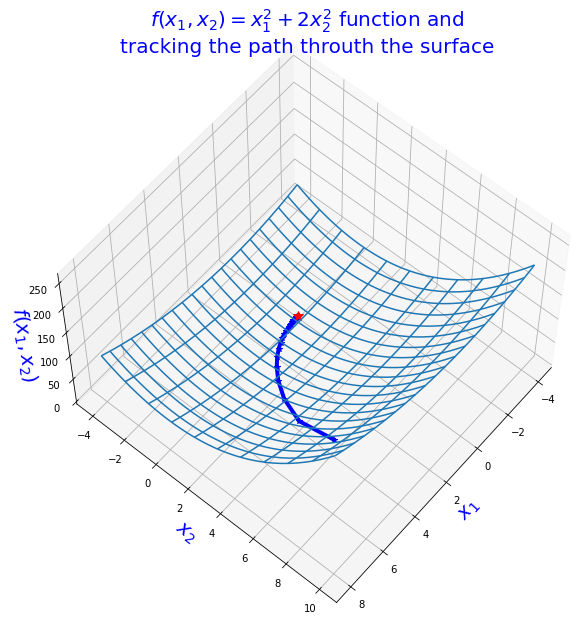

In [41]:
result_4b=perturbed_GD([6,8],"poly",Std_Norm_Noise=False)
all_7_plots(result_4b,Function)

# * Data collection for comparison

## -(i) Starting from a particular point how many average steps are required to reach near the minimum ,i.e, with in the sphere of radius $0.01$

### data for method-1  constant LR

In [42]:
result_1a=perturbed_GD([2,4],"costant",how_close_to_minima=0.01)
result_1a=perturbed_GD([2,4],"costant",how_close_to_minima=0.01)
result_1a=perturbed_GD([2,4],"costant",how_close_to_minima=0.01)
result_1a=perturbed_GD([2,4],"costant",how_close_to_minima=0.01)

The method used is: costant

Total iteration nedded is   23   which is less than the maximum iteration(1000)

The method used is: costant

Total iteration nedded is   26   which is less than the maximum iteration(1000)

The method used is: costant

Total iteration nedded is   27   which is less than the maximum iteration(1000)

The method used is: costant

Total iteration nedded is   11   which is less than the maximum iteration(1000)



In [43]:
result_1b=perturbed_GD([2,4],"costant",Std_Norm_Noise=False,how_close_to_minima=0.01)
result_1b=perturbed_GD([2,4],"costant",Std_Norm_Noise=False,how_close_to_minima=0.01)
result_1b=perturbed_GD([2,4],"costant",Std_Norm_Noise=False,how_close_to_minima=0.01)
result_1b=perturbed_GD([2,4],"costant",Std_Norm_Noise=False,how_close_to_minima=0.01)

The method used is: costant

Total iteration nedded is   13   which is less than the maximum iteration(1000)

The method used is: costant

Total iteration nedded is   13   which is less than the maximum iteration(1000)

The method used is: costant

Total iteration nedded is   13   which is less than the maximum iteration(1000)

The method used is: costant

Total iteration nedded is   14   which is less than the maximum iteration(1000)



### data for method-2  peice wise changing LR

In [44]:
result_2a=perturbed_GD([2,4],"pcwise",how_close_to_minima=0.01)
result_2a=perturbed_GD([2,4],"pcwise",how_close_to_minima=0.01)
result_2a=perturbed_GD([2,4],"pcwise",how_close_to_minima=0.01)
result_2a=perturbed_GD([2,4],"pcwise",how_close_to_minima=0.01)

The method used is: pcwise

Maximum iteration(1000) reached. As you made it stochastic it might not reach the minimum

The method used is: pcwise

Maximum iteration(1000) reached. As you made it stochastic it might not reach the minimum

The method used is: pcwise

Maximum iteration(1000) reached. As you made it stochastic it might not reach the minimum

The method used is: pcwise

Total iteration nedded is   16   which is less than the maximum iteration(1000)



In [45]:
result_2b=perturbed_GD([2,4],"pcwise",Std_Norm_Noise=False,how_close_to_minima=0.01)
result_2b=perturbed_GD([2,4],"pcwise",Std_Norm_Noise=False,how_close_to_minima=0.01)
result_2b=perturbed_GD([2,4],"pcwise",Std_Norm_Noise=False,how_close_to_minima=0.01)
result_2b=perturbed_GD([2,4],"pcwise",Std_Norm_Noise=False,how_close_to_minima=0.01)

The method used is: pcwise

Total iteration nedded is   13   which is less than the maximum iteration(1000)

The method used is: pcwise

Total iteration nedded is   13   which is less than the maximum iteration(1000)

The method used is: pcwise

Total iteration nedded is   13   which is less than the maximum iteration(1000)

The method used is: pcwise

Total iteration nedded is   13   which is less than the maximum iteration(1000)



### data for method-2  exponnentially LR

In [46]:
result_3a=perturbed_GD([2,4],"exp",how_close_to_minima=0.01)
result_3a=perturbed_GD([2,4],"exp",how_close_to_minima=0.01)
result_3a=perturbed_GD([2,4],"exp",how_close_to_minima=0.01)
result_3a=perturbed_GD([2,4],"exp",how_close_to_minima=0.01)

The method used is: exp

Total iteration nedded is   36   which is less than the maximum iteration(1000)

The method used is: exp

Maximum iteration(1000) reached. As you made it stochastic it might not reach the minimum

The method used is: exp

Maximum iteration(1000) reached. As you made it stochastic it might not reach the minimum

The method used is: exp

Maximum iteration(1000) reached. As you made it stochastic it might not reach the minimum



In [47]:
result_3b=perturbed_GD([2,4],"exp",Std_Norm_Noise=False,how_close_to_minima=0.01)
result_3b=perturbed_GD([2,4],"exp",Std_Norm_Noise=False,how_close_to_minima=0.01)
result_3b=perturbed_GD([2,4],"exp",Std_Norm_Noise=False,how_close_to_minima=0.01)
result_3b=perturbed_GD([2,4],"exp",Std_Norm_Noise=False,how_close_to_minima=0.01)

The method used is: exp

Maximum iteration(1000) reached. As you made it stochastic it might not reach the minimum

The method used is: exp

Maximum iteration(1000) reached. As you made it stochastic it might not reach the minimum

The method used is: exp

Maximum iteration(1000) reached. As you made it stochastic it might not reach the minimum

The method used is: exp

Maximum iteration(1000) reached. As you made it stochastic it might not reach the minimum



### data for method-4  polynomially LR

In [48]:
result_4a=perturbed_GD([2,4],"poly",how_close_to_minima=0.01)
result_4a=perturbed_GD([2,4],"poly",how_close_to_minima=0.01)
result_4a=perturbed_GD([2,4],"poly",how_close_to_minima=0.01)
result_4a=perturbed_GD([2,4],"poly",how_close_to_minima=0.01)

The method used is: poly

Total iteration nedded is   32   which is less than the maximum iteration(1000)

The method used is: poly

Total iteration nedded is   12   which is less than the maximum iteration(1000)

The method used is: poly

Total iteration nedded is   50   which is less than the maximum iteration(1000)

The method used is: poly

Total iteration nedded is   40   which is less than the maximum iteration(1000)



In [49]:
result_4b=perturbed_GD([2,4],"poly",Std_Norm_Noise=False,how_close_to_minima=0.01)
result_4b=perturbed_GD([2,4],"poly",Std_Norm_Noise=False,how_close_to_minima=0.01)
result_4b=perturbed_GD([2,4],"poly",Std_Norm_Noise=False,how_close_to_minima=0.01)
result_4b=perturbed_GD([2,4],"poly",Std_Norm_Noise=False,how_close_to_minima=0.01)

The method used is: poly

Total iteration nedded is   17   which is less than the maximum iteration(1000)

The method used is: poly

Total iteration nedded is   17   which is less than the maximum iteration(1000)

The method used is: poly

Total iteration nedded is   18   which is less than the maximum iteration(1000)

The method used is: poly

Total iteration nedded is   17   which is less than the maximum iteration(1000)



## -(ii)starting from a particular point how many average steps are required to reach near the minimum ,i.e, with in the sphere of radius $0.001$

### 1

In [50]:
result_1a=perturbed_GD([2,4],"costant",how_close_to_minima=0.001)
result_1a=perturbed_GD([2,4],"costant",how_close_to_minima=0.001)
result_1a=perturbed_GD([2,4],"costant",how_close_to_minima=0.001)
result_1a=perturbed_GD([2,4],"costant",how_close_to_minima=0.001)

The method used is: costant

Total iteration nedded is   44   which is less than the maximum iteration(1000)

The method used is: costant

Total iteration nedded is   210   which is less than the maximum iteration(1000)

The method used is: costant

Total iteration nedded is   37   which is less than the maximum iteration(1000)

The method used is: costant

Total iteration nedded is   121   which is less than the maximum iteration(1000)



In [51]:
result_1b=perturbed_GD([2,4],"costant",Std_Norm_Noise=False,how_close_to_minima=0.001)
result_1b=perturbed_GD([2,4],"costant",Std_Norm_Noise=False,how_close_to_minima=0.001)
result_1b=perturbed_GD([2,4],"costant",Std_Norm_Noise=False,how_close_to_minima=0.001)
result_1b=perturbed_GD([2,4],"costant",Std_Norm_Noise=False,how_close_to_minima=0.001)

The method used is: costant

Total iteration nedded is   17   which is less than the maximum iteration(1000)

The method used is: costant

Total iteration nedded is   186   which is less than the maximum iteration(1000)

The method used is: costant

Total iteration nedded is   39   which is less than the maximum iteration(1000)

The method used is: costant

Total iteration nedded is   19   which is less than the maximum iteration(1000)



### 2

In [52]:
result_2a=perturbed_GD([2,4],"pcwise",how_close_to_minima=0.001)
result_2a=perturbed_GD([2,4],"pcwise",how_close_to_minima=0.001)
result_2a=perturbed_GD([2,4],"pcwise",how_close_to_minima=0.001)
result_2a=perturbed_GD([2,4],"pcwise",how_close_to_minima=0.001)

The method used is: pcwise

Total iteration nedded is   11   which is less than the maximum iteration(1000)

The method used is: pcwise

Maximum iteration(1000) reached. As you made it stochastic it might not reach the minimum

The method used is: pcwise

Maximum iteration(1000) reached. As you made it stochastic it might not reach the minimum

The method used is: pcwise

Maximum iteration(1000) reached. As you made it stochastic it might not reach the minimum



In [53]:
result_2b=perturbed_GD([2,4],"pcwise",Std_Norm_Noise=False,how_close_to_minima=0.001)
result_2b=perturbed_GD([2,4],"pcwise",Std_Norm_Noise=False,how_close_to_minima=0.001)
result_2b=perturbed_GD([2,4],"pcwise",Std_Norm_Noise=False,how_close_to_minima=0.001)
result_2b=perturbed_GD([2,4],"pcwise",Std_Norm_Noise=False,how_close_to_minima=0.001)

The method used is: pcwise

Total iteration nedded is   18   which is less than the maximum iteration(1000)

The method used is: pcwise

Total iteration nedded is   17   which is less than the maximum iteration(1000)

The method used is: pcwise

Total iteration nedded is   17   which is less than the maximum iteration(1000)

The method used is: pcwise

Total iteration nedded is   17   which is less than the maximum iteration(1000)



### 3

In [54]:
result_3a=perturbed_GD([2,4],"exp",how_close_to_minima=0.001)
result_3a=perturbed_GD([2,4],"exp",how_close_to_minima=0.001)
result_3a=perturbed_GD([2,4],"exp",how_close_to_minima=0.001)
result_3a=perturbed_GD([2,4],"exp",how_close_to_minima=0.001)

The method used is: exp

Maximum iteration(1000) reached. As you made it stochastic it might not reach the minimum

The method used is: exp

Maximum iteration(1000) reached. As you made it stochastic it might not reach the minimum

The method used is: exp

Maximum iteration(1000) reached. As you made it stochastic it might not reach the minimum

The method used is: exp

Maximum iteration(1000) reached. As you made it stochastic it might not reach the minimum



In [55]:
result_3b=perturbed_GD([2,4],"exp",Std_Norm_Noise=False,how_close_to_minima=0.001)
result_3b=perturbed_GD([2,4],"exp",Std_Norm_Noise=False,how_close_to_minima=0.001)
result_3b=perturbed_GD([2,4],"exp",Std_Norm_Noise=False,how_close_to_minima=0.001)
result_3b=perturbed_GD([2,4],"exp",Std_Norm_Noise=False,how_close_to_minima=0.001)

The method used is: exp

Maximum iteration(1000) reached. As you made it stochastic it might not reach the minimum

The method used is: exp

Maximum iteration(1000) reached. As you made it stochastic it might not reach the minimum

The method used is: exp

Maximum iteration(1000) reached. As you made it stochastic it might not reach the minimum

The method used is: exp

Maximum iteration(1000) reached. As you made it stochastic it might not reach the minimum



### 4

In [56]:
result_4a=perturbed_GD([2,4],"poly",how_close_to_minima=0.001)
result_4a=perturbed_GD([2,4],"poly",how_close_to_minima=0.001)
result_4a=perturbed_GD([2,4],"poly",how_close_to_minima=0.001)
result_4a=perturbed_GD([2,4],"poly",how_close_to_minima=0.001)

The method used is: poly

Total iteration nedded is   23   which is less than the maximum iteration(1000)

The method used is: poly

Total iteration nedded is   20   which is less than the maximum iteration(1000)

The method used is: poly

Total iteration nedded is   36   which is less than the maximum iteration(1000)

The method used is: poly

Total iteration nedded is   30   which is less than the maximum iteration(1000)



In [57]:
result_4b=perturbed_GD([2,4],"poly",Std_Norm_Noise=False,how_close_to_minima=0.001)
result_4b=perturbed_GD([2,4],"poly",Std_Norm_Noise=False,how_close_to_minima=0.001)
result_4b=perturbed_GD([2,4],"poly",Std_Norm_Noise=False,how_close_to_minima=0.001)
result_4b=perturbed_GD([2,4],"poly",Std_Norm_Noise=False,how_close_to_minima=0.001)

The method used is: poly

Maximum iteration(1000) reached. As you made it stochastic it might not reach the minimum

The method used is: poly

Total iteration nedded is   25   which is less than the maximum iteration(1000)

The method used is: poly

Total iteration nedded is   25   which is less than the maximum iteration(1000)

The method used is: poly

Total iteration nedded is   23   which is less than the maximum iteration(1000)



## -(iii)starting from a particular point how many average steps are required to reach the minimum ,i.e, with in the sphere of radius $0.0001$

- Note : None of these methods reached the minimum exactly. Among them polynomial one reached closer to minima.

In [58]:
result_1a=perturbed_GD([2,4],"costant",how_close_to_minima=0.0001)
result_1a=perturbed_GD([2,4],"costant",how_close_to_minima=0.0001)
result_1a=perturbed_GD([2,4],"costant",how_close_to_minima=0.0001)
result_1a=perturbed_GD([2,4],"costant",how_close_to_minima=0.0001)

The method used is: costant

Total iteration nedded is   298   which is less than the maximum iteration(1000)

The method used is: costant

Total iteration nedded is   215   which is less than the maximum iteration(1000)

The method used is: costant

Total iteration nedded is   583   which is less than the maximum iteration(1000)

The method used is: costant

Maximum iteration(1000) reached. As you made it stochastic it might not reach the minimum



In [59]:
result_1b=perturbed_GD([2,4],"costant",Std_Norm_Noise=False,how_close_to_minima=0.0001)
result_1b=perturbed_GD([2,4],"costant",Std_Norm_Noise=False,how_close_to_minima=0.0001)
result_1b=perturbed_GD([2,4],"costant",Std_Norm_Noise=False,how_close_to_minima=0.0001)
result_1b=perturbed_GD([2,4],"costant",Std_Norm_Noise=False,how_close_to_minima=0.0001)

The method used is: costant

Maximum iteration(1000) reached. As you made it stochastic it might not reach the minimum

The method used is: costant

Maximum iteration(1000) reached. As you made it stochastic it might not reach the minimum

The method used is: costant

Maximum iteration(1000) reached. As you made it stochastic it might not reach the minimum

The method used is: costant

Maximum iteration(1000) reached. As you made it stochastic it might not reach the minimum



In [60]:
result_2a=perturbed_GD([2,4],"pcwise",how_close_to_minima=0.0001)
result_2a=perturbed_GD([2,4],"pcwise",how_close_to_minima=0.0001)
result_2a=perturbed_GD([2,4],"pcwise",how_close_to_minima=0.0001)
result_2a=perturbed_GD([2,4],"pcwise",how_close_to_minima=0.0001)

The method used is: pcwise

Maximum iteration(1000) reached. As you made it stochastic it might not reach the minimum

The method used is: pcwise

Maximum iteration(1000) reached. As you made it stochastic it might not reach the minimum

The method used is: pcwise

Maximum iteration(1000) reached. As you made it stochastic it might not reach the minimum

The method used is: pcwise

Maximum iteration(1000) reached. As you made it stochastic it might not reach the minimum



In [61]:
result_2b=perturbed_GD([2,4],"pcwise",Std_Norm_Noise=False,how_close_to_minima=0.0001)
result_2b=perturbed_GD([2,4],"pcwise",Std_Norm_Noise=False,how_close_to_minima=0.0001)
result_2b=perturbed_GD([2,4],"pcwise",Std_Norm_Noise=False,how_close_to_minima=0.0001)
result_2b=perturbed_GD([2,4],"pcwise",Std_Norm_Noise=False,how_close_to_minima=0.0001)

The method used is: pcwise

Maximum iteration(1000) reached. As you made it stochastic it might not reach the minimum

The method used is: pcwise

Maximum iteration(1000) reached. As you made it stochastic it might not reach the minimum

The method used is: pcwise

Maximum iteration(1000) reached. As you made it stochastic it might not reach the minimum

The method used is: pcwise

Maximum iteration(1000) reached. As you made it stochastic it might not reach the minimum



In [62]:
result_3a=perturbed_GD([2,4],"exp",how_close_to_minima=0.0001)
result_3a=perturbed_GD([2,4],"exp",how_close_to_minima=0.0001)
result_3a=perturbed_GD([2,4],"exp",how_close_to_minima=0.0001)
result_3a=perturbed_GD([2,4],"exp",how_close_to_minima=0.0001)

The method used is: exp

Maximum iteration(1000) reached. As you made it stochastic it might not reach the minimum

The method used is: exp

Maximum iteration(1000) reached. As you made it stochastic it might not reach the minimum

The method used is: exp

Maximum iteration(1000) reached. As you made it stochastic it might not reach the minimum

The method used is: exp

Maximum iteration(1000) reached. As you made it stochastic it might not reach the minimum



In [63]:
result_3b=perturbed_GD([2,4],"exp",Std_Norm_Noise=False,how_close_to_minima=0.0001)
result_3b=perturbed_GD([2,4],"exp",Std_Norm_Noise=False,how_close_to_minima=0.0001)
result_3b=perturbed_GD([2,4],"exp",Std_Norm_Noise=False,how_close_to_minima=0.0001)
result_3b=perturbed_GD([2,4],"exp",Std_Norm_Noise=False,how_close_to_minima=0.0001)

The method used is: exp

Maximum iteration(1000) reached. As you made it stochastic it might not reach the minimum

The method used is: exp

Maximum iteration(1000) reached. As you made it stochastic it might not reach the minimum

The method used is: exp

Maximum iteration(1000) reached. As you made it stochastic it might not reach the minimum

The method used is: exp

Maximum iteration(1000) reached. As you made it stochastic it might not reach the minimum



In [64]:
result_4a=perturbed_GD([2,4],"poly",how_close_to_minima=0.0001)
result_4a=perturbed_GD([2,4],"poly",how_close_to_minima=0.0001)
result_4a=perturbed_GD([2,4],"poly",how_close_to_minima=0.0001)
result_4a=perturbed_GD([2,4],"poly",how_close_to_minima=0.0001)

The method used is: poly

Maximum iteration(1000) reached. As you made it stochastic it might not reach the minimum

The method used is: poly

Total iteration nedded is   117   which is less than the maximum iteration(1000)

The method used is: poly

Total iteration nedded is   101   which is less than the maximum iteration(1000)

The method used is: poly

Total iteration nedded is   79   which is less than the maximum iteration(1000)



In [65]:
result_4b=perturbed_GD([2,4],"poly",Std_Norm_Noise=False,how_close_to_minima=0.0001)
result_4b=perturbed_GD([2,4],"poly",Std_Norm_Noise=False,how_close_to_minima=0.0001)
result_4b=perturbed_GD([2,4],"poly",Std_Norm_Noise=False,how_close_to_minima=0.0001)
result_4b=perturbed_GD([2,4],"poly",Std_Norm_Noise=False,how_close_to_minima=0.0001)

The method used is: poly

Maximum iteration(1000) reached. As you made it stochastic it might not reach the minimum

The method used is: poly

Maximum iteration(1000) reached. As you made it stochastic it might not reach the minimum

The method used is: poly

Maximum iteration(1000) reached. As you made it stochastic it might not reach the minimum

The method used is: poly

Maximum iteration(1000) reached. As you made it stochastic it might not reach the minimum



## Plots showing comparison

The method used is: constant

Total iteration nedded is   76   which is less than the maximum iteration(1000)

The method used is: pcwise

Maximum iteration(1000) reached. As you made it stochastic it might not reach the minimum

The method used is: exp

Maximum iteration(1000) reached. As you made it stochastic it might not reach the minimum

The method used is: poly

Total iteration nedded is   63   which is less than the maximum iteration(1000)



<IPython.core.display.Javascript object>


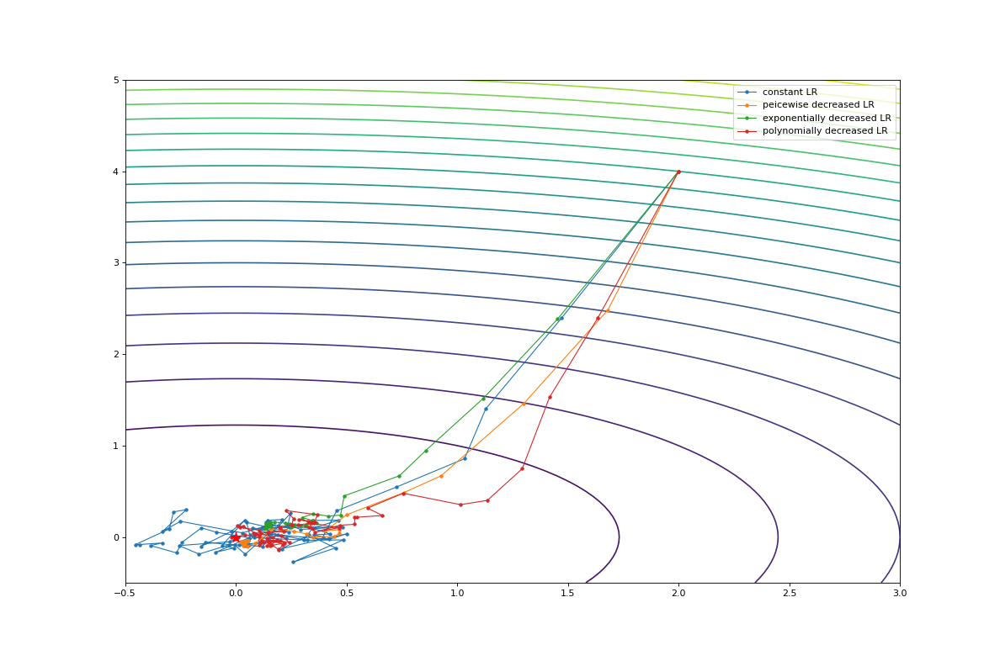

<IPython.core.display.Javascript object>


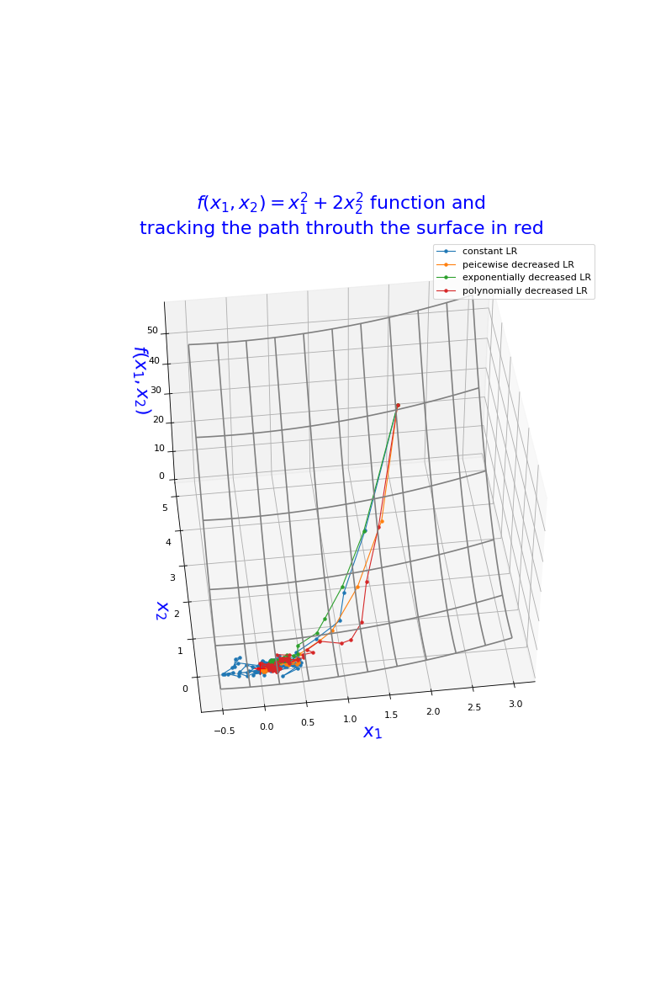

In [66]:
result_1a=perturbed_GD([2,4],"constant",how_close_to_minima=0.001)

result_2a=perturbed_GD([2,4],"pcwise",how_close_to_minima=0.001)

result_3a=perturbed_GD([2,4],"exp",how_close_to_minima=0.001)

result_4a=perturbed_GD([2,4],"poly",how_close_to_minima=0.001)


%matplotlib notebook
plt.figure(figsize=(15,10))


a=np.linspace(-0.5,3,100)
b=np.linspace(-0.5,5,100)
c,d=np.meshgrid(a,b)
z=Function((c,d))

plt.contour(c,d,z,20)
plt.plot(result_1a[0],result_1a[1],".-", linewidth=1,label="constant LR")
plt.plot(result_2a[0],result_2a[1],".-", linewidth=1,label="peicewise decreased LR")
plt.plot(result_3a[0],result_3a[1],".-", linewidth=1,label="exponentially decreased LR")
plt.plot(result_4a[0],result_4a[1],".-", linewidth=1,label="polynomially decreased LR")
plt.plot(0,0,0,"r*-", markersize=12)
plt.legend()
plt.show()

plt.figure(figsize=(10,15))
ax=plt.axes(projection="3d")
ax.plot_wireframe(c,d,z,rstride=20, cstride=10,color="gray")
# ax.contour3D(c,d,z,100,cmap="viridis")
ax.view_init(60,40)
ax.plot3D(result_1a[0],result_1a[1],result_1a[2],".-", linewidth=1,label="constant LR")
ax.plot3D(result_2a[0],result_2a[1],result_2a[2],".-", linewidth=1,label="peicewise decreased LR")
ax.plot3D(result_3a[0],result_3a[1],result_3a[2],".-", linewidth=1,label="exponentially decreased LR")
ax.plot3D(result_4a[0],result_4a[1],result_4a[2],".-", linewidth=1,label="polynomially decreased LR")
ax.plot3D(0,0,0,"r+-", markersize=12)
# ax.scatter(result[0],result[1],result[2], c='red', s=100)
ax.set_xlabel("$x_1$",fontdict={ "fontsize": 20 , "color": "blue" })
ax.set_ylabel("$x_2$",fontdict={ "fontsize": 20 , "color": "blue" })
ax.set_zlabel("$ f(x_1,x_2)$",fontdict={ "fontsize": 20 , "color": "blue" })
ax.set_title("$ f(x_1, x_2) =  x_1^2 +2 x_2^2 $ function and \ntracking the path throuth the surface in red",fontdict={ "fontsize": 20 , "color": "blue" , "horizontalalignment":"center"})
plt.legend()
plt.show()

The method used is: constant

Total iteration nedded is   17   which is less than the maximum iteration(1000)

The method used is: pcwise

Total iteration nedded is   17   which is less than the maximum iteration(1000)

The method used is: exp

Maximum iteration(1000) reached. As you made it stochastic it might not reach the minimum

The method used is: poly

Total iteration nedded is   24   which is less than the maximum iteration(1000)



<IPython.core.display.Javascript object>


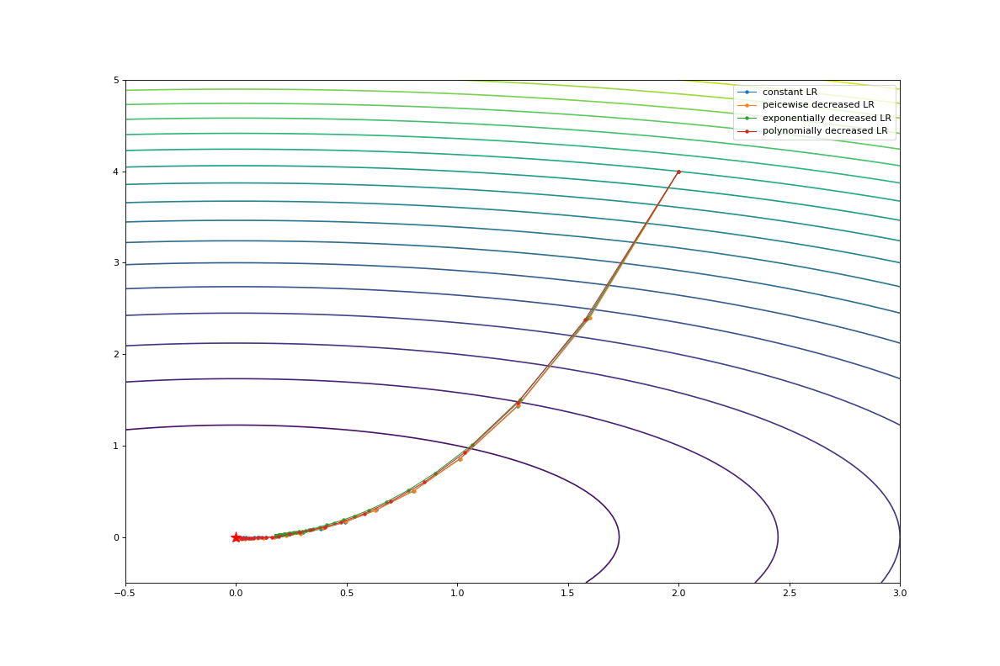

<IPython.core.display.Javascript object>


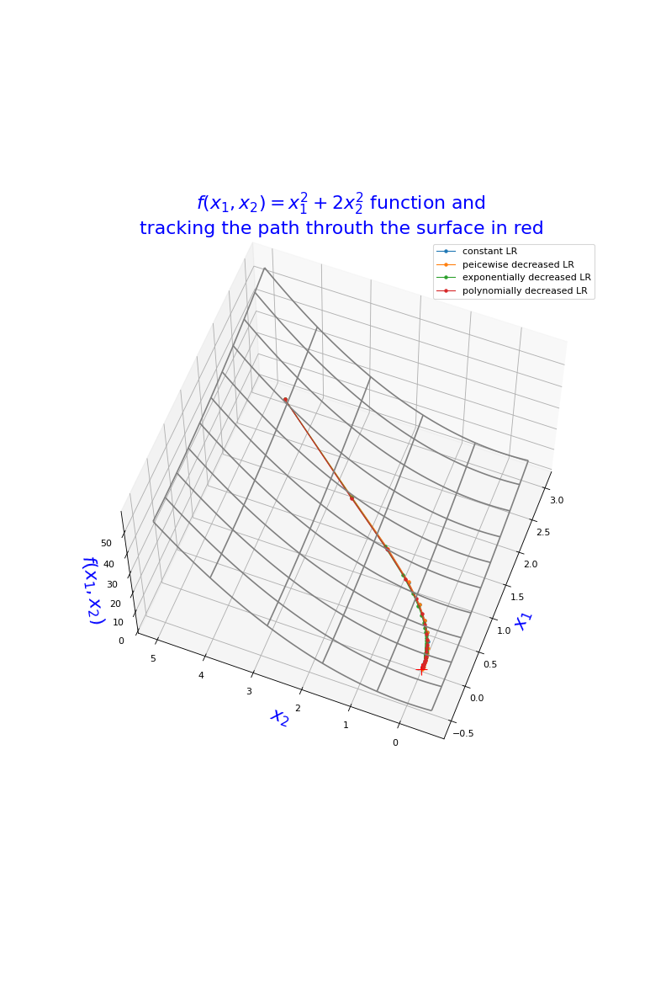

In [67]:
result_1b=perturbed_GD([2,4],"constant",Std_Norm_Noise=False,how_close_to_minima=0.001)

result_2b=perturbed_GD([2,4],"pcwise",Std_Norm_Noise=False,how_close_to_minima=0.001)

result_3b=perturbed_GD([2,4],"exp",Std_Norm_Noise=False,how_close_to_minima=0.001)

result_4b=perturbed_GD([2,4],"poly",Std_Norm_Noise=False,how_close_to_minima=0.001)


%matplotlib notebook
plt.figure(figsize=(15,10))


a=np.linspace(-0.5,3,100)
b=np.linspace(-0.5,5,100)
c,d=np.meshgrid(a,b)
z=Function((c,d))

plt.contour(c,d,z,20)
plt.plot(result_1b[0],result_1b[1],".-", linewidth=1,label="constant LR")
plt.plot(result_2b[0],result_2b[1],".-", linewidth=1,label="peicewise decreased LR")
plt.plot(result_3b[0],result_3b[1],".-", linewidth=1,label="exponentially decreased LR")
plt.plot(result_4b[0],result_4b[1],".-", linewidth=1,label="polynomially decreased LR")
plt.plot(0,0,0,"r*-", markersize=12)
plt.legend()
plt.show()

plt.figure(figsize=(10,15))
ax=plt.axes(projection="3d")
ax.plot_wireframe(c,d,z,rstride=20, cstride=10,color="gray")
# ax.contour3D(c,d,z,100,cmap="viridis")
ax.view_init(60,40)
ax.plot3D(result_1b[0],result_1b[1],result_1b[2],".-", linewidth=1,label="constant LR")
ax.plot3D(result_2b[0],result_2b[1],result_2b[2],".-", linewidth=1,label="peicewise decreased LR")
ax.plot3D(result_3b[0],result_3b[1],result_3b[2],".-", linewidth=1,label="exponentially decreased LR")
ax.plot3D(result_4b[0],result_4b[1],result_4b[2],".-", linewidth=1,label="polynomially decreased LR")
ax.plot3D(0,0,0,"r+-", markersize=12)
# ax.scatter(result[0],result[1],result[2], c='red', s=100)
ax.set_xlabel("$x_1$",fontdict={ "fontsize": 20 , "color": "blue" })
ax.set_ylabel("$x_2$",fontdict={ "fontsize": 20 , "color": "blue" })
ax.set_zlabel("$ f(x_1,x_2)$",fontdict={ "fontsize": 20 , "color": "blue" })
ax.set_title("$ f(x_1, x_2) =  x_1^2 +2 x_2^2 $ function and \ntracking the path throuth the surface in red",fontdict={ "fontsize": 20 , "color": "blue" , "horizontalalignment":"center"})
plt.legend()
plt.show()

# For the function $\large f(x_1, x_2) =  x_1^2 - 2 x_2^2$

In [68]:
%matplotlib inline

In [70]:
def Function1(X):
    x1=X[0]
    x2=X[1]
    return x1**2 - 2*(x2**2)
def Gradient1(X):
    x1=X[0]
    x2=X[1]
    return np.asarray([2*x1 , -(4*x2)])

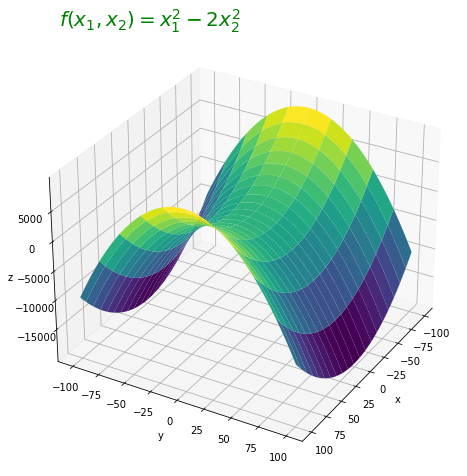

In [71]:
a=b=np.linspace(-100,100,100)
c,d=np.meshgrid(a,b)
z=Function((c,d))

plt.figure(figsize=(8,8))
ax=plt.axes(projection="3d")
ax.plot_surface(c,d,z,cstride=5,cmap="viridis")
ax.set_xlabel("x")
ax.set_ylabel("y")
ax.set_zlabel("z")
ax.set_title("$ f(x_1, x_2) =  x_1^2 -2 x_2^2 $ ",fontdict={ "fontsize": 20 , "color": "green" , "horizontalalignment":"right"})
ax.view_init(30,30)

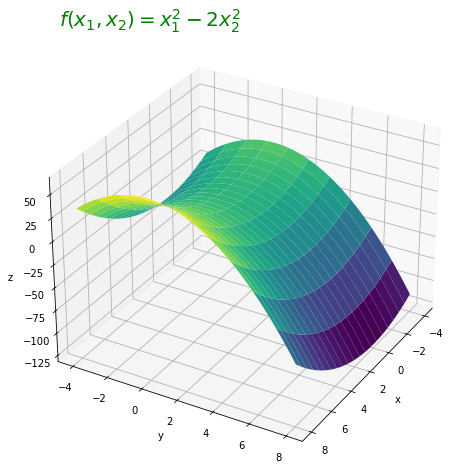

In [72]:
a=b=np.linspace(-4,8,100)
c,d=np.meshgrid(a,b)
z=Function((c,d))

plt.figure(figsize=(8,8))
ax=plt.axes(projection="3d")
ax.plot_surface(c,d,z,cstride=5,cmap="viridis")
ax.set_xlabel("x")
ax.set_ylabel("y")
ax.set_zlabel("z")
ax.set_title("$ f(x_1, x_2) =  x_1^2 -2 x_2^2 $ ",fontdict={ "fontsize": 20 , "color": "green" , "horizontalalignment":"right"})
ax.view_init(30,30)

## 2nd function:   1(a) when Lr is chaning $polynomially$    with noise from N(0,1) 

The method used is: constant

Maximum iteration(20) reached. As you made it stochastic it might not reach the minimum



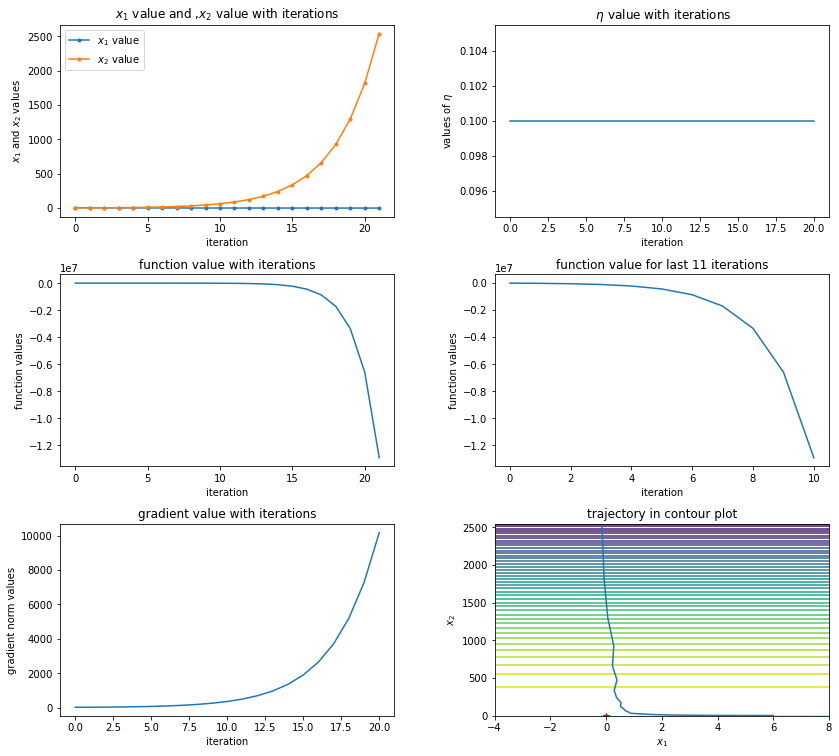

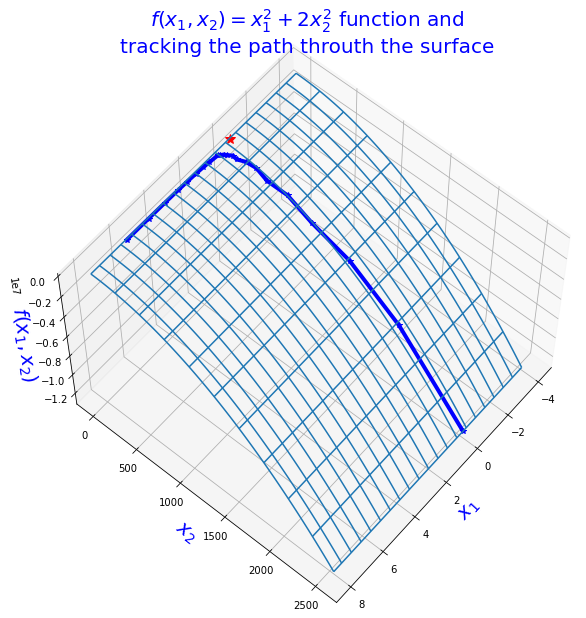

In [74]:
result_1a=perturbed_GD([6,2],"constant",max_iteration=20,F=Function1,G=Gradient1)
all_7_plots(result_1a,Function1)

## 2nd function:   1(b) when Lr is $constant$   with noise from +N(0,0.1) 

The method used is: constant

Maximum iteration(20) reached. As you made it stochastic it might not reach the minimum



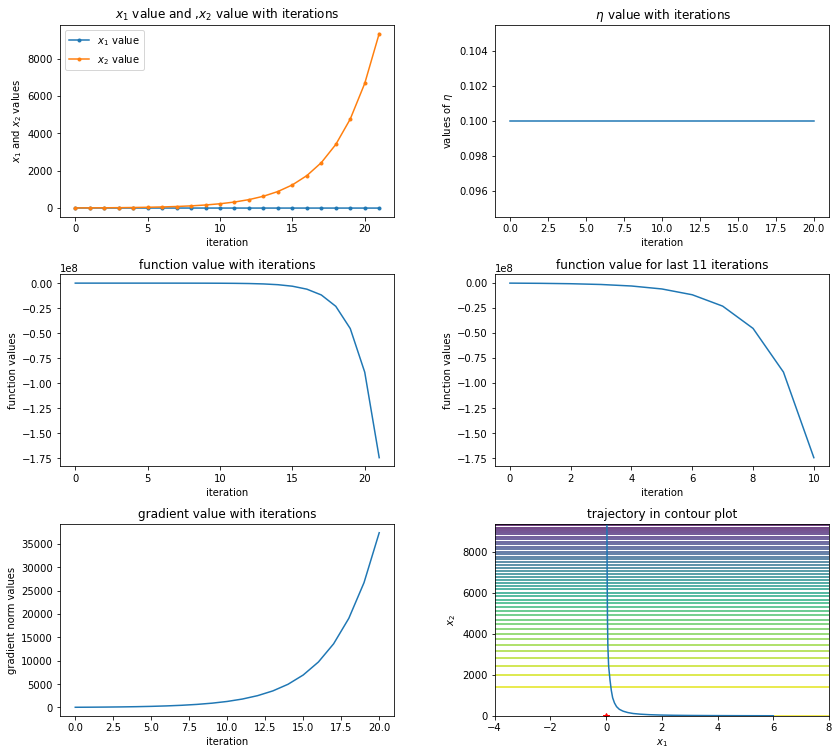

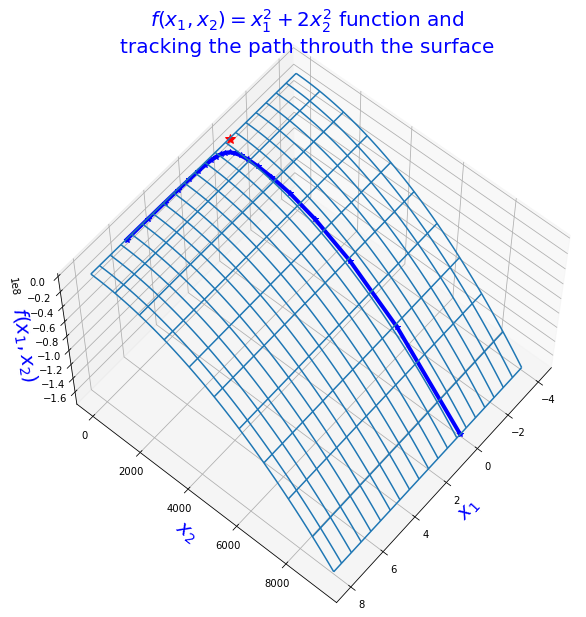

In [82]:
result_1b=perturbed_GD([6,8],"constant",Std_Norm_Noise=False,max_iteration=20,F=Function1,G=Gradient1)
all_7_plots(result_1b,Function1)

## 2nd function:   2(b) when Lr is chaning $peice wise$    with noise from +N(0,0.1) 

The method used is: pcwise

Maximum iteration(1000) reached. As you made it stochastic it might not reach the minimum



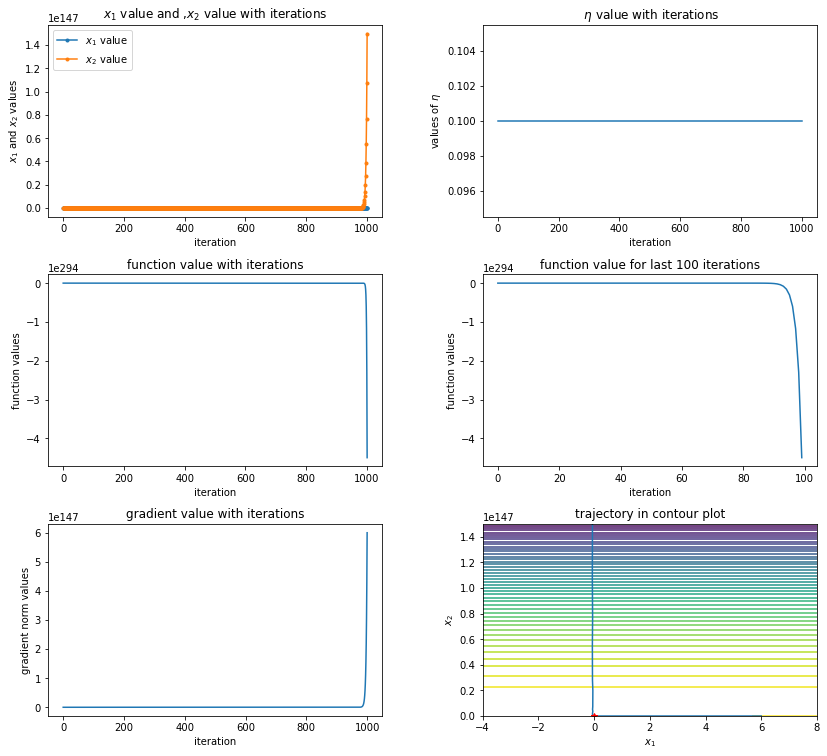

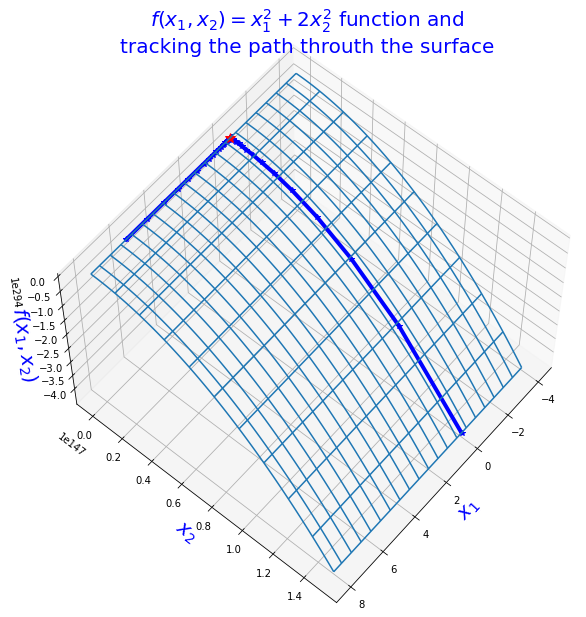

In [83]:
result_2b=perturbed_GD([6,8],"pcwise",Std_Norm_Noise=False,F=Function1,G=Gradient1)
all_7_plots(result_2b,Function1)

## 2nd function:   3(b) when Lr is chaning $exponentially$    with noise from +N(0,0.1) 

The method used is: exp

Maximum iteration(1000) reached. As you made it stochastic it might not reach the minimum



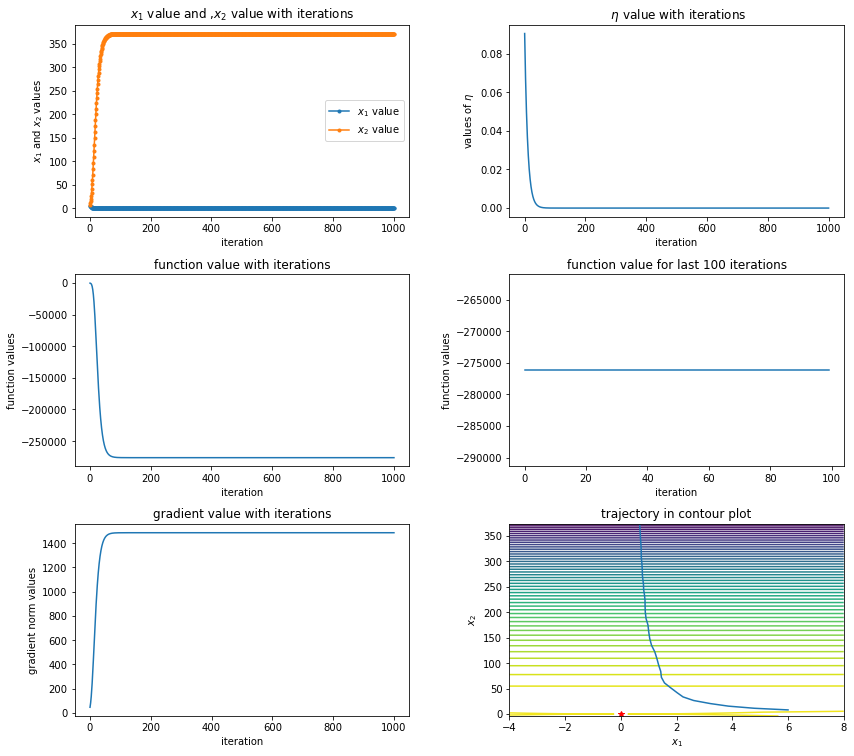

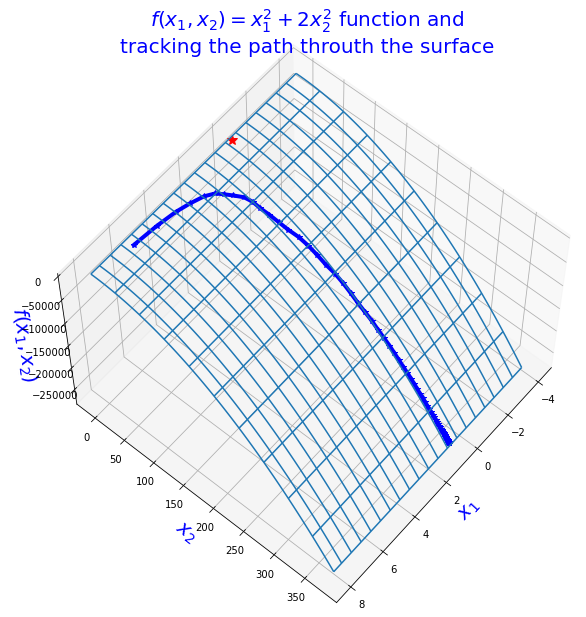

In [80]:
result_3b=perturbed_GD([6,8],"exp",F=Function1,G=Gradient1)
all_7_plots(result_3b,Function1)

## 2nd function:   4(b) when Lr is chaning $polynomially$    with noise from +N(0,0.1) 

The method used is: poly

Maximum iteration(1000) reached. As you made it stochastic it might not reach the minimum



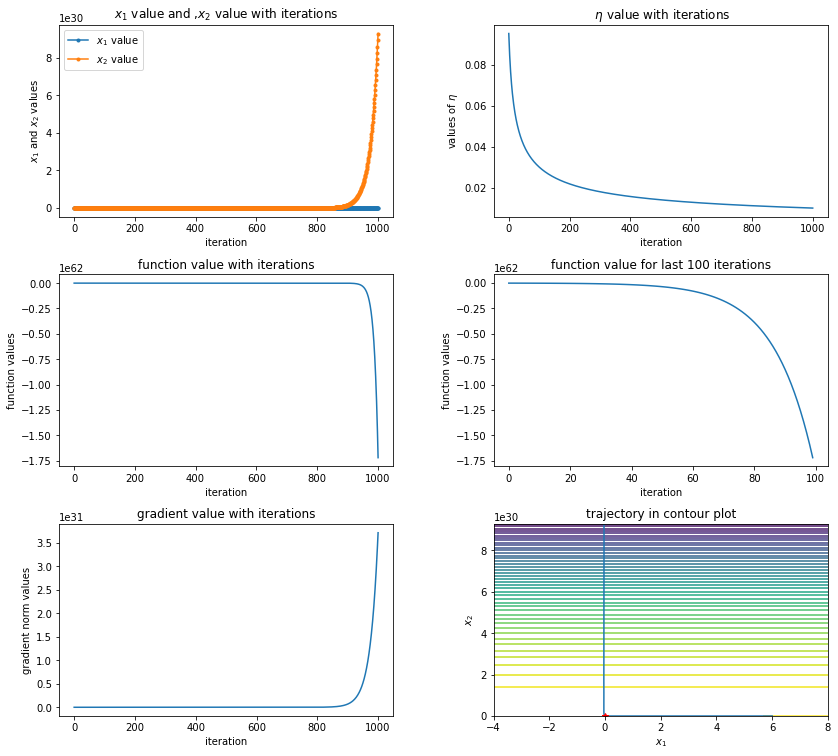

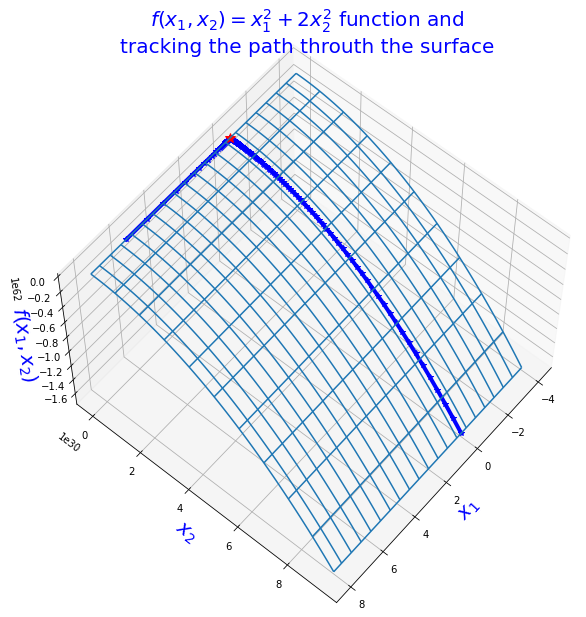

In [79]:
result_4b=perturbed_GD([6,8],"poly",Std_Norm_Noise=False,F=Function1,G=Gradient1)
all_7_plots(result_4b,Function1)

# The detailed explanaation is in report 
                                           
                                           
                                           
                                           ********----**********

# 

# 

# <span class="burk">simulation of mini batch graient descent</span>   MBGD

## functions

In [98]:
# The same cell can be found at the top of this notebook


# Required Libraries 
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from mpl_toolkits import mplot3d
%matplotlib inline 

def Function(X):
    x1=X[0]
    x2=X[1]
    return x1**2 +2*(x2**2)
def Gradient(X):
    x1=X[0]
    x2=X[1]
    return np.asarray([2*x1 , 4*x2])

In [99]:
# The same cell can be found at the top of this notebook



def plot_3D_plot(result,Function):
    lower_x=-4
    higher_x=max(result[0])+2
    lower_y=-4
    higher_y=max(result[1])+2
    a=np.linspace(lower_x,higher_x,100)
    b=np.linspace(lower_y,higher_y,100)
    c,d=np.meshgrid(a,b)
    z=Function((c,d))
    plt.figure(figsize=(10,10))
    ax=plt.axes(projection="3d")
    
    ax.plot_wireframe(c,d,z,rstride=10, cstride=5,cmap="gray")#,color="gray"),
    # ax.contour3D(c,d,z,100,cmap="viridis"),
    ax.view_init(60,40),
    ax.plot3D(result[0],result[1],result[2],"b*-", linewidth=4),
    ax.plot3D(0,0,0,"r*-", markersize=10),
    # ax.scatter(result[0],result[1],result[2], c='red', s=100),
    ax.set_xlabel("$x_1$",fontdict={ "fontsize": 20 , "color": "blue" }),
    ax.set_ylabel("$x_2$",fontdict={ "fontsize": 20 , "color": "blue" }),
    ax.set_zlabel("$ f(x_1,x_2)$",fontdict={ "fontsize": 20 , "color": "blue" }),
    ax.set_title("$ f(x_1, x_2) =  x_1^2 +2 x_2^2 $ function and \ntracking the path throuth the surface",fontdict={ "fontsize": 20 , "color": "blue" , "horizontalalignment":"center"}),

    
    return plt.show()


def all_7_plots(result,Function):
    plt.figure(figsize=(12,12))
    
    plt.subplot(321)
    plt.plot(result[0],".-",label="$x_1$ value")
    plt.plot(result[1],".-",label="$x_2$ value")
    plt.title("$x_1$ value and ,$x_2$ value with iterations")
    plt.xlabel("iteration")
    plt.ylabel("$x_1$ and $x_2$ values")
    plt.legend()

    plt.subplot(322)
    data=pd.DataFrame({"G1_noise":result[5],"G2_noise":result[6],"norm of noise":result[7]})
    plt.violinplot(data,positions=None, vert=False, widths=0.5, showmeans=False, showextrema=True, showmedians=True,  quantiles=[[0,0.25,0.5,0.75,1],[0,0.25,0.5,0.75,1],[0,0.25,0.5,0.75,1]], points=100, bw_method=None, data=None)
#     sns.displot(data,  x=result[5], y=result[6],kind="kde", rug=True)
#     plt.plot(result[5],".-",label="$G_1 noise$ value")
#     plt.plot(result[6],".-",label="$G_2 noise$ value")
#     plt.plot(result[7],".-",label="norm of noise")
    plt.title("distribution of noise and its norm value")
    plt.xlabel("values of noise")
    plt.ylabel("G1_noise    G2_noise     norm of noise") 
#     plt.legend()
    
    plt.subplot(323)
    plt.plot(result[2])
    plt.title("function value with iterations")
    plt.xlabel("iteration")
    plt.ylabel("function values")

    plt.subplot(324)
    if len(result[2])<50:
        last=np.int(len(result[2])/2)
    else:
        last=np.int(len(result[2])/10)
    plt.plot(result[2][-last:])
    plt.title("function value for last {} iterations".format(last))
    plt.xlabel("iteration")
    plt.ylabel("function values at the end")


    plt.subplot(325)
    plt.plot(result[4])
    plt.title("gradient value with iterations")
    plt.xlabel("iteration")
    plt.ylabel("values of norm of gradient")

    plt.subplot(326)
    lower_x=-4
    higher_x=max(result[0])+2
    lower_y=-4
    higher_y=max(result[1])+2
    a=np.linspace(lower_x,higher_x,100)
    b=np.linspace(lower_y,higher_y,100)
    c,d=np.meshgrid(a,b)
    z=Function((c,d))
    plt.contour(c,d,z,50)
    plt.plot(result[0],result[1])
    plt.plot(0,0,"r*")
    plt.title("trajectory in contour plot")
    plt.xlabel("$x_1$")
    plt.ylabel("$x_2$")

    plt.subplots_adjust(left=0.01,bottom=0.1, right=0.9, top=0.9, wspace=0.3, hspace=0.3)
    
    plot_3D_plot(result,Function)
    return plt.show()


In [100]:
# The same cell can be found at the top of this notebook   but the output has been modefied


## All 4 methods are applyed in one function

def perturbed_GD(X,method,F=Function,G=Gradient,bita=0.1,eta_0=0.1,alpha=0.5,lamda=0.1,max_iteration=2000,Std_Norm_Noise=True,how_close_to_minima=0.001):
    function_values_list=[F(X)]
    x1_values_list=[X[0]]     # values of x coordinate
    x2_values_list=[X[1]]     # values of y coordinate
    eta_values_list=[]        # values of eta ,i.e, Learning Rate of GD
    grad_values_list=[]       # norm values of Gradient at the current point
    noise_G1=[]
    noise_G2=[]
    noise_values_list=[]
    eta=eta_0
    iteration=0
    print("The method used is: {}".format(method))
    while (iteration<= max_iteration): 
        if np.linalg.norm(F(X)-np.asarray([0,0]))>how_close_to_minima:
            iteration+=1
            if Std_Norm_Noise==True:       # if noise is taken from N(0,1)
                noise=np.random.randn(2)
            else:                          # if noise is taken from N(0,0.1) and >0
                [[grad_x1_noise,grad_x2_noise]] = np.random.normal(0,0.1, size=(1,2))
                noise= np.asarray(np.abs(grad_x1_noise),np.abs(grad_x2_noise))
            noise_G1.append(noise[0])
            noise_G2.append(noise[1])
            noise_values_list.append(np.linalg.norm(noise))
            X-= eta*(G(X) + noise)
            grad_values_list.append(np.linalg.norm(G(X)))
            x1_values_list.append(X[0])
            x2_values_list.append(X[1])
            function_values_list.append(Function(X))
        else:
            break
        
        if method=="constant":         # if eta is not changing throughout the iterations
            eta=eta
        if method=="pcwise":           # if eta is decreasing when the function value is increasing 
            if F([x1_values_list[-1],x2_values_list[-1]])-F([x1_values_list[-2],x2_values_list[-2]]) >0:
                eta=eta/2
        if method=="exp":              # if eta is decreasing exponentially  
            eta= eta_0 * np.exp(-lamda*iteration)
        if method=="poly":             # if eta is decreasing polynomially
            eta=eta_0*(1+bita*iteration)**(-alpha)
            
        eta_values_list.append(eta)
        
        
    if iteration< max_iteration:
        print("\nTotal iteration nedded is   {} to reach {} unit close to minima which is less than the maximum iteration({})\n".format(iteration,how_close_to_minima,max_iteration))
    if iteration>max_iteration:
        print("\nMaximum iteration({}) reached. As you made it stochastic it might not reach the minimum\n".format(max_iteration))
    return x1_values_list , x2_values_list ,function_values_list, eta_values_list ,grad_values_list,noise_G1,noise_G2,noise_values_list


In [101]:
## All 4 methods are applied in one function

def perturbed_MBGD(X,no_of_random_no=20,method="constant",F=Function,G=Gradient,bita=0.1,eta_0=0.1,alpha=0.5,lamda=0.1,max_iteration=2000,Std_Norm_Noise=True,how_close_to_minima=0.001):
    function_values_list=[F(X)]
    x1_values_list=[X[0]]     # values of x coordinate
    x2_values_list=[X[1]]     # values of y coordinate
    eta_values_list=[]        # values of eta ,i.e, Learning Rate of GD
    grad_values_list=[]      # norm values of Gradient at the current point
    noise_G1=[]
    noise_G2=[]
    noise_values_list=[]
    eta=eta_0
    iteration=0
    print("The method used is: {}".format(method))
    while (iteration<= max_iteration): 
        if np.linalg.norm(F(X)-np.asarray([0,0]))>how_close_to_minima:
            iteration+=1
            
            random_x1=0
            random_x2=0
            for i in range(no_of_random_no):
                noise=np.random.randn(2)
                random_x1 += noise[0]
                random_x2 += noise[1]
                
            noise=np.asarray([random_x1/no_of_random_no,random_x2/no_of_random_no])
            noise_G1.append(noise[0])
            noise_G2.append(noise[1])              
            noise_values_list.append(np.linalg.norm(noise))
            
#             if Std_Norm_Noise==True:       # if noise is taken from N(0,1)
#                 noise=np.random.randn(2)
#             else:                          # if noise is taken from N(0,0.1) and >0
#                 [[grad_x1_noise,grad_x2_noise]] = np.random.normal(0,0.1, size=(1,2))
#                 noise= np.asarray(np.abs(grad_x1_noise),np.abs(grad_x2_noise))

            X-= eta*(G(X) + noise)
            grad_values_list.append(np.linalg.norm(G(X)))
            x1_values_list.append(X[0])
            x2_values_list.append(X[1])
            function_values_list.append(Function(X))
        else:
            break
        
        if method=="constant":         # if eta is not changing throughout the iterations
            eta=eta
        if method=="pcwise":           # if eta is decreasing when the function value is increasing 
            if F([x1_values_list[-1],x2_values_list[-1]])-F([x1_values_list[-2],x2_values_list[-2]]) >0:
                eta=eta/2
        if method=="exp":              # if eta is decreasing exponentially  
            eta= eta_0 * np.exp(-lamda*iteration)
        if method=="poly":             # if eta is decreasing polynomially
            eta=eta_0*(1+bita*iteration)**(-alpha)
            
        eta_values_list.append(eta)
        
        
    if iteration< max_iteration:
        print("\nTotal iteration nedded is   {} to reach {} unit close to minima  which is less than the maximum iteration({})\n".format(iteration,how_close_to_minima,max_iteration))
    if iteration>max_iteration:
        print("\nMaximum iteration({}) reached. As you made it stochastic it might not reach the minimum\n".format(max_iteration))
    return x1_values_list , x2_values_list ,function_values_list, eta_values_list ,grad_values_list,noise_G1,noise_G2,noise_values_list


# for the function <span class="girk">$\large f(x_1, x_2) =  x_1^2 + 2 x_2^2$</span> [ SGD vs MBGD ]
 here the purturbation will be used in a different style ( taking the average of a large no of random variable
 
 then I shall compare it with before results in SGD next I will change the function a little $\large ( f(x_1, x_2) = 0.1 x_1^2 + 2 x_2^2  ) $and use the same thing and then use a new thing called momentum updation of gradients.

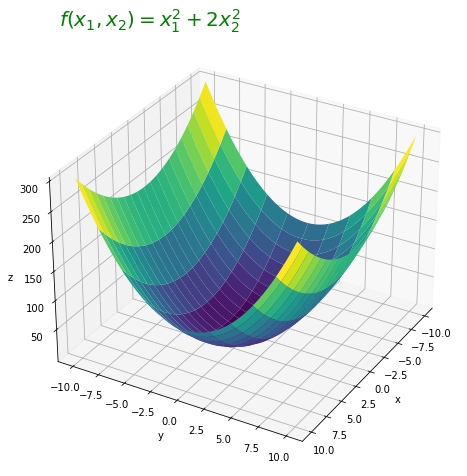

In [102]:
a=b=np.linspace(-10,10,100)
c,d=np.meshgrid(a,b)
z=Function((c,d))

plt.figure(figsize=(8,8))
ax=plt.axes(projection="3d")
ax.plot_surface(c,d,z,cstride=5,cmap="viridis")
ax.set_xlabel("x")
ax.set_ylabel("y")
ax.set_zlabel("z")
ax.set_title("$ f(x_1, x_2) =  x_1^2 +2 x_2^2 $ ",fontdict={ "fontsize": 20 , "color": "green" , "horizontalalignment":"right"})
ax.view_init(30,30)

The method used is: constant

Total iteration nedded is   318 to reach 0.001 unit close to minima which is less than the maximum iteration(2000)



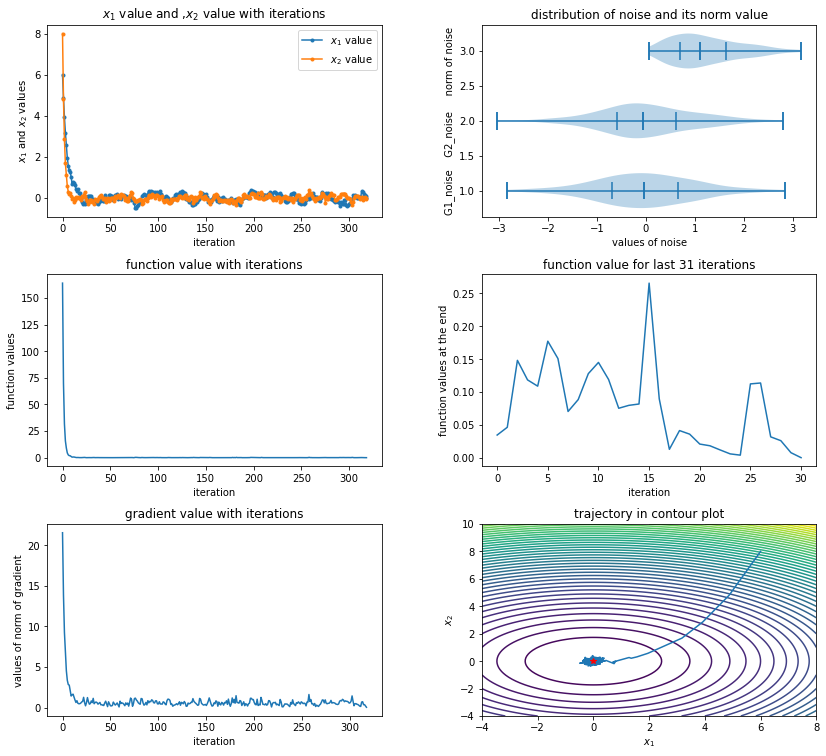

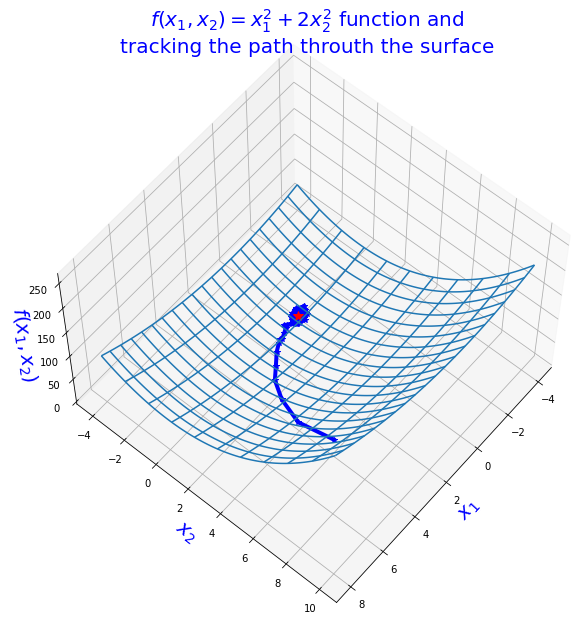

In [103]:
# SGD
result_1a=perturbed_GD([6,8],"constant")
all_7_plots(result_1a,Function)

The method used is: constant

Total iteration nedded is   29 to reach 0.001 unit close to minima  which is less than the maximum iteration(2000)



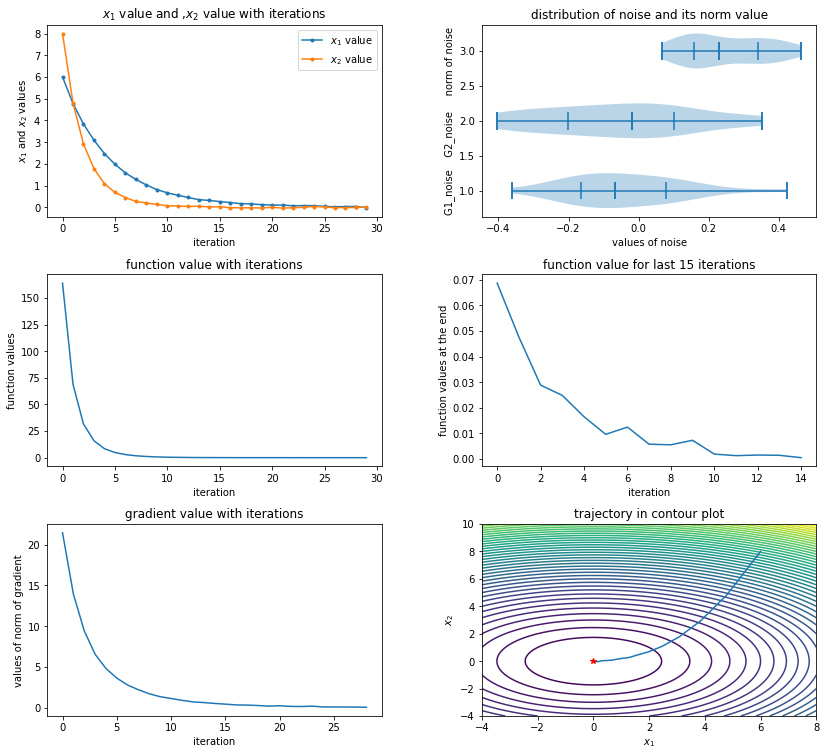

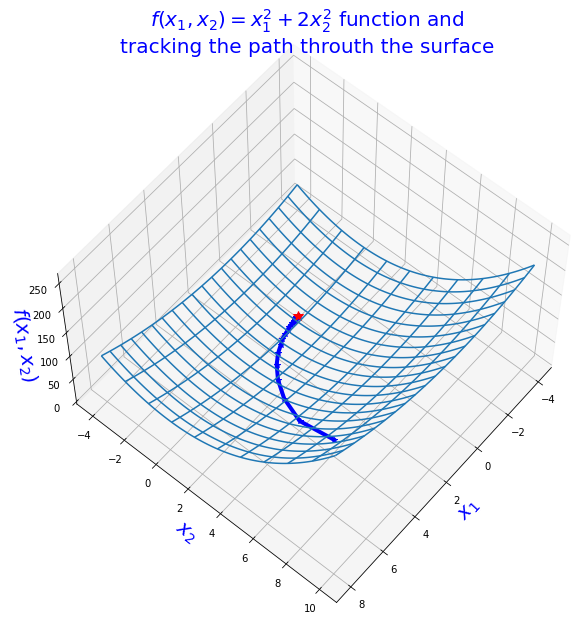

In [104]:
#MBGD
result_1a=perturbed_MBGD([6,8])
all_7_plots(result_1a,Function)

# Play with random numbers

In [105]:
no_set=[10,50,100,500,1000,5000]

big_list=[]
for i in no_set:
    noise_G1=[]
    noise_G2=[]
    noise_values_list=[]
    for _ in range(i):
        noise=np.random.randn(2)
        noise_G1.append(noise[0])
        noise_G2.append(noise[1])              
        noise_values_list.append(np.linalg.norm(noise))
    big_list.append([noise_G1,noise_G2,noise_values_list])

In [106]:
no_set=[10,50,100,500,1000,5000,10000]

big_list=[]
for i in no_set:
    noise_G1=[]
    noise_G2=[]
    noise_values_list=[]
    for _ in range(i):
        noise_G1.append(np.random.randn())
        noise_G2.append(np.random.randn())
        noise=np.asarray([noise_G1[-1],noise_G2[-1]])
        noise_values_list.append(np.linalg.norm(noise))
    big_list.append([noise_G1,noise_G2,noise_values_list])

<ipython-input-107-475415765f40>:6: MatplotlibDeprecationWarning: Passing non-integers as three-element position specification is deprecated since 3.3 and will be removed two minor releases later.
  plt.subplot(np.ceil(len(no_set)/2),2,i+1)


For n= 10, 
The mean value of norms of random errors is 0.927 and variance is 0.338 *****

For n= 50, 
The mean value of norms of random errors is 1.23 and variance is 0.476 *****

For n= 100, 
The mean value of norms of random errors is 1.335 and variance is 0.52 *****

For n= 500, 
The mean value of norms of random errors is 1.245 and variance is 0.442 *****

For n= 1000, 
The mean value of norms of random errors is 1.279 and variance is 0.429 *****

For n= 5000, 
The mean value of norms of random errors is 1.231 and variance is 0.401 *****

For n= 10000, 
The mean value of norms of random errors is 1.257 and variance is 0.426 *****



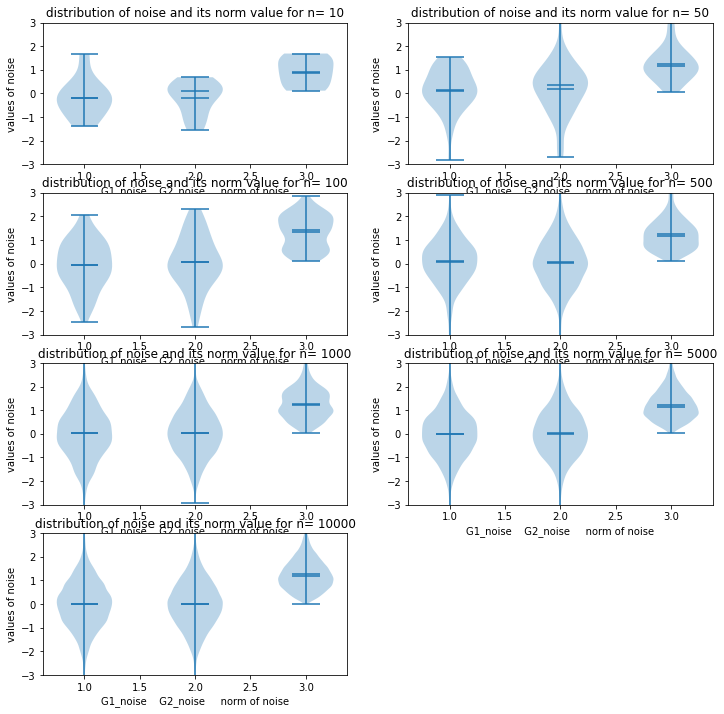

In [107]:
import statistics

plt.figure(figsize=(12,12))

for i in range(len(no_set)):
    plt.subplot(np.ceil(len(no_set)/2),2,i+1)
    plt.violinplot(big_list[i],positions=None, vert=True, widths=0.5, showmeans=True, showextrema=True, showmedians=True, bw_method=None, data=None)
    plt.ylim(-3,3)
    plt.title("distribution of noise and its norm value for n= {}".format(no_set[i]))
    plt.ylabel("values of noise")
    plt.xlabel("G1_noise    G2_noise     norm of noise") 
    print("For n= {}, \nThe mean value of norms of random errors is {} and variance is {} *****\n".format(no_set[i],np.round(np.mean(big_list[i][2]),3),np.round(statistics.variance(big_list[i][2]),3)))

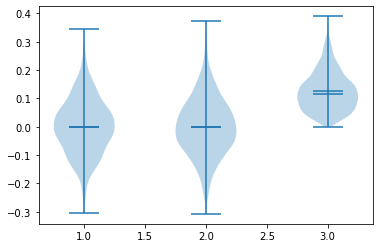

In [108]:
point,iteration=1000,100

noise_G1=[]
noise_G2=[]
noise_values_list=[]
for i in range(point):
    random_x1=0
    random_x2=0
    for j in range(iteration):
        noise=np.random.randn(2)
        random_x1 += noise[0]
        random_x2 += noise[1]        
    noise=np.asarray([random_x1/iteration,random_x2/iteration])
    noise_G1.append(noise[0])
    noise_G2.append(noise[1])              
    noise_values_list.append(np.linalg.norm(noise))
    
    
plt.violinplot([noise_G1,noise_G2,noise_values_list],positions=None, vert=True, widths=0.5, showmeans=True, showextrema=True, showmedians=True, bw_method=None, data=None)
plt.show()

In [109]:
no_set=[10,50,100,500,1000,5000,10000]

def check_randomness(no_set):
    big_list2=[]
    for count in no_set:
        mean_1000=[]
        var_1000=[]
        noise_values_list=[]
        for _ in range(1000):
            rand_nos=[]
            for i in range(count):
                rand_nos.append(np.random.randn())
            mean_1000.append(np.mean(rand_nos))
            var_1000.append(statistics.variance(rand_nos))
        big_list2.append([mean_1000,var_1000])
    return big_list2


<ipython-input-111-314bf04fa1e9>:4: MatplotlibDeprecationWarning: Passing non-integers as three-element position specification is deprecated since 3.3 and will be removed two minor releases later.
  plt.subplot(np.ceil(len(no_set)/2),2,i+1)


For n= 10, 
The mean value of norms of random errors is -0.007 and variance is 0.217 *****

For n= 50, 
The mean value of norms of random errors is -0.004 and variance is 0.037 *****

For n= 100, 
The mean value of norms of random errors is 0.001 and variance is 0.022 *****

For n= 500, 
The mean value of norms of random errors is -0.0 and variance is 0.004 *****

For n= 1000, 
The mean value of norms of random errors is 0.001 and variance is 0.002 *****

For n= 5000, 
The mean value of norms of random errors is 0.0 and variance is 0.0 *****

For n= 10000, 
The mean value of norms of random errors is -0.0 and variance is 0.0 *****



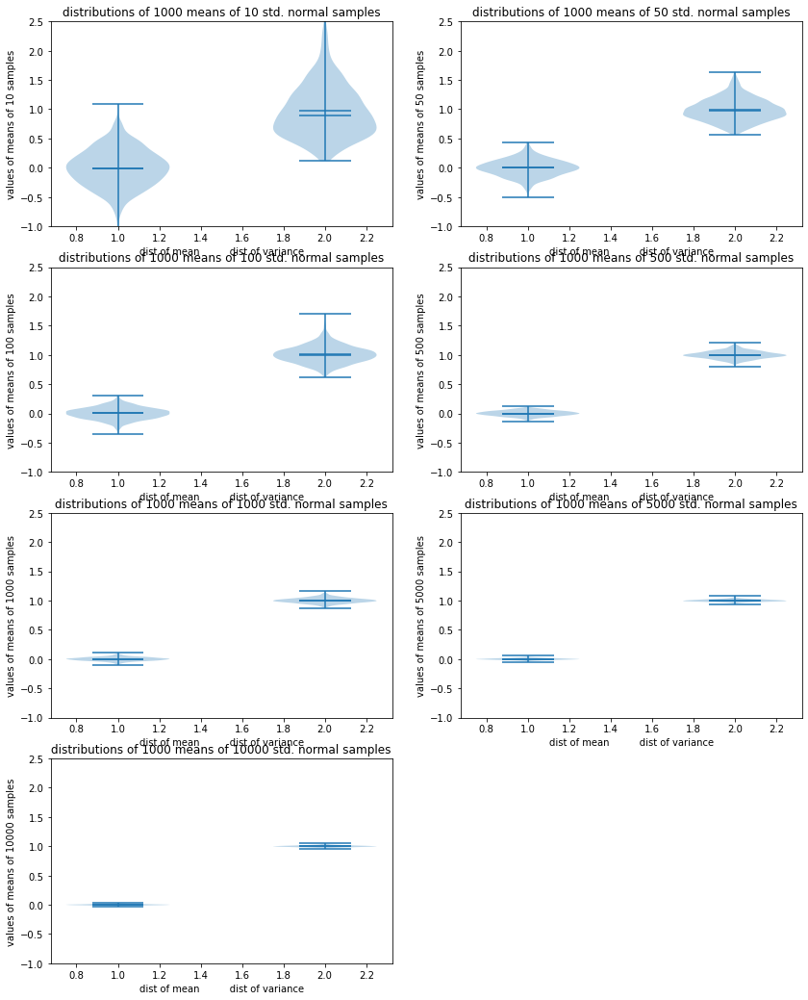

In [111]:
big_list2=check_randomness(no_set)
plt.figure(figsize=(14,18))
for i in range(len(no_set)):
    plt.subplot(np.ceil(len(no_set)/2),2,i+1)
    plt.violinplot(big_list2[i],positions=None, vert=True, widths=0.5, showmeans=True, showextrema=True, showmedians=True, bw_method=None, data=None)
    plt.ylim(-1,2.5)
    plt.title("distributions of 1000 means of {} std. normal samples".format(no_set[i]))
    plt.ylabel("values of means of {} samples".format(no_set[i]))
    plt.xlabel("dist of mean          dist of variance") 
    print("For n= {}, \nThe mean value of norms of random errors is {} and variance is {} *****\n".format(no_set[i],np.round(np.mean(big_list2[i][0]),3),np.round(statistics.variance(big_list2[i][1]),3)))

In [112]:
# Some other distribution plot

In [113]:
import seaborn as sns
sns.distplot(result[5], hist = False, kde = True,kde_kws = {'shade': True, 'linewidth': 3},label = "dfhn")
sns.distplot(result[6], hist = False, kde = True,kde_kws = {'shade': True, 'linewidth': 3},label = "dfhn")
sns.distplot(result[7], hist = False, kde = True,kde_kws = {'shade': True, 'linewidth': 3},label = "dfhn")
plt.show()

NameError: name 'result' is not defined

In [114]:
sns.displot(data=data.iloc[:,:],kind="kde")

NameError: name 'data' is not defined

NameError: name 'data' is not defined

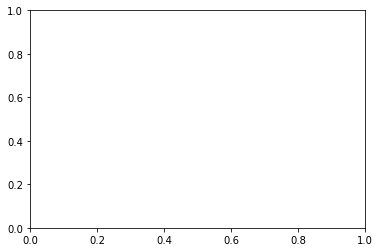

In [115]:
fig, ax = plt.subplots()
data.plot.kde(ax=ax, legend=False, title='Histogram: A vs. B')
data.plot.hist(density=True, ax=ax)
ax.set_ylabel('Probability')
ax.grid(axis='y')
# ax.set_facecolor('#d8dcd6')

# 

# Now for the func. <span class="girk">$\large f(x_1, x_2) =  0.1x_1^2 + 2 x_2^2$</span>  [MBGD vs SGD ]

In [116]:
# Required Libraries 
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from mpl_toolkits import mplot3d
%matplotlib inline 

def Function2(X):
    x1=X[0]
    x2=X[1]
    return 0.1*(x1**2) +2*(x2**2)
def Gradient2(X):
    x1=X[0]
    x2=X[1]
    return np.asarray([0.2*x1 , 4*x2])

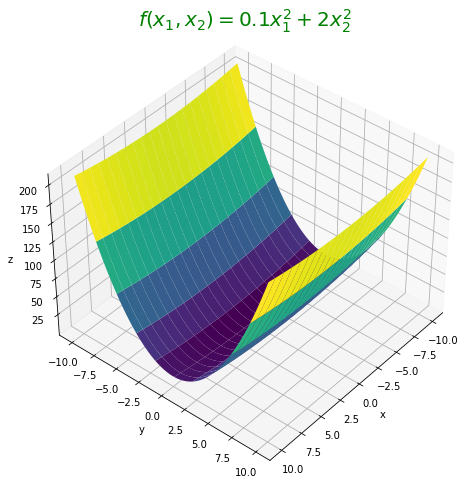

In [117]:
a=b=np.linspace(-10,10,100)
c,d=np.meshgrid(a,b)
z=Function2((c,d))

plt.figure(figsize=(8,8))
ax=plt.axes(projection="3d")
ax.plot_surface(c,d,z,cstride=5,cmap="viridis")
ax.set_xlabel("x")
ax.set_ylabel("y")
ax.set_zlabel("z")
ax.set_title("$f(x_1, x_2) =  0.1x_1^2 + 2 x_2^2$ ",fontdict={ "fontsize": 20 , "color": "green" , "horizontalalignment":"center"})
ax.view_init(40,40)

The method used is: constant

Total iteration nedded is   284 to reach 0.001 unit close to minima which is less than the maximum iteration(2000)



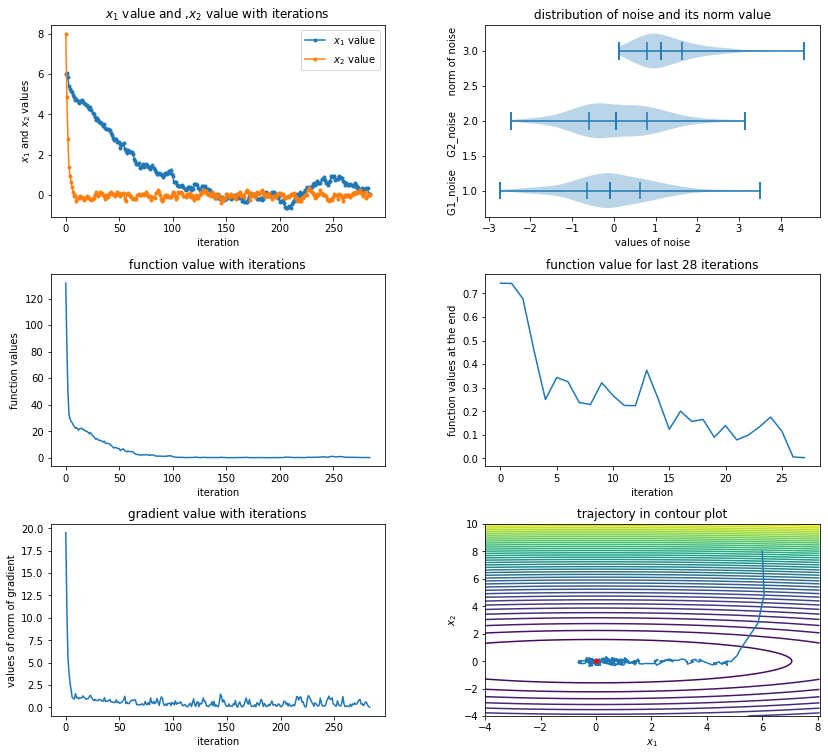

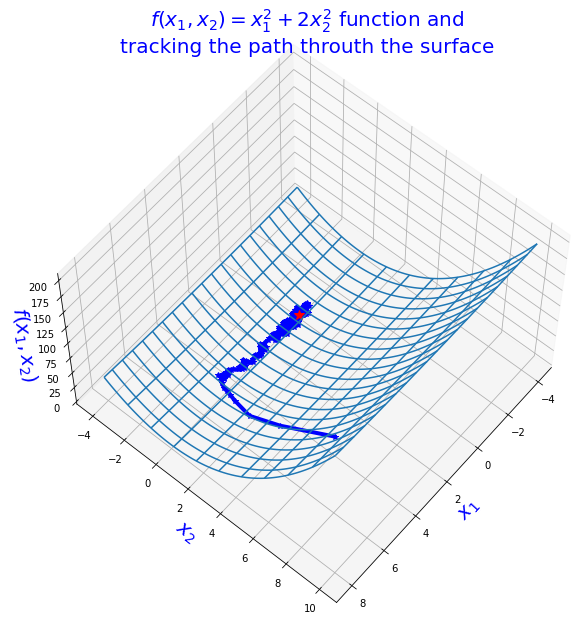

In [118]:
#SGD
result_1a=perturbed_GD([6,8],method="constant",F=Function2,G=Gradient2)
all_7_plots(result_1a,Function2)

The method used is: constant

Total iteration nedded is   189 to reach 0.001 unit close to minima  which is less than the maximum iteration(2000)



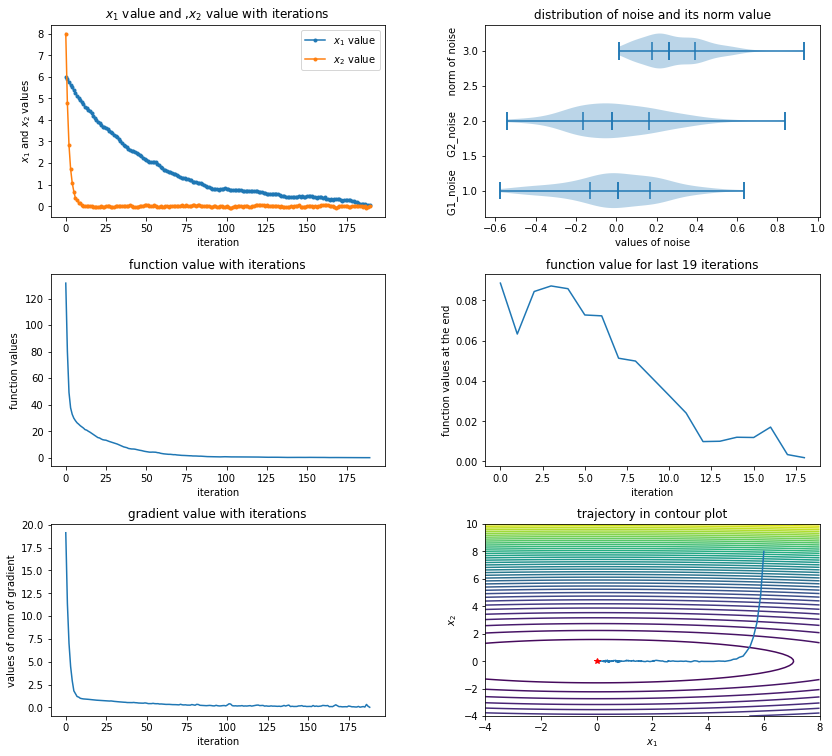

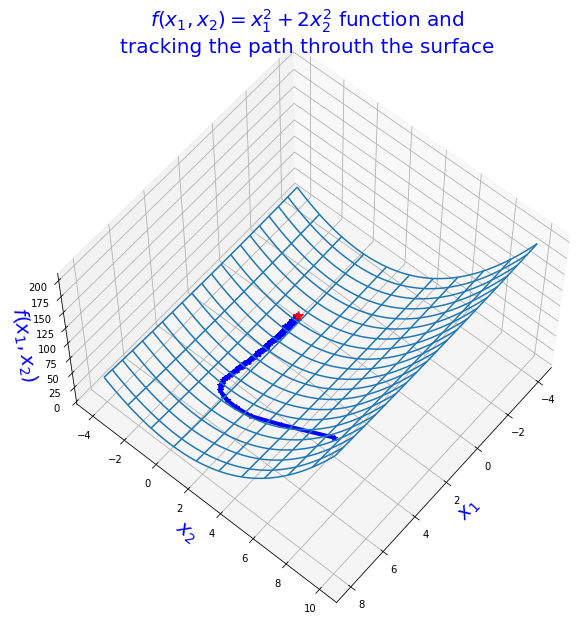

In [119]:
#MBGD
result_1a=perturbed_MBGD([6,8],method="constant",F=Function2,G=Gradient2)
all_7_plots(result_1a,Function2)

# *<span class="burk">MOMENTUM* in "SGD and MINI-BATCH-GD" simulated version</span> 

## MOMENTUM with SGD

In [120]:
# ## All 4 methods are applyed in one function

# def perturbed_GD_momentum(X=[4,6],method="constant",F=Function,G=Gradient,mu=0.9,bita=0.1,eta_0=0.1,alpha=0.5,lamda=0.1,max_iteration=20,Std_Norm_Noise=True,how_close_to_minima=0.001):
#     function_values_list=[F(X)]
#     x1_values_list=[X[0]]     # values of x coordinate
#     x2_values_list=[X[1]]     # values of y coordinate
#     eta_values_list=[]        # values of eta ,i.e, Learning Rate of GD
#     grad_values_list=[]       # norm values of Gradient at the current point
#     eta=eta_0
#     iteration=0
#     v=np.asarray([0,0])
#     print("The method used is: {}".format(method))
#     while (iteration<= max_iteration): 
#         if np.linalg.norm(F(X)-np.asarray([0,0]))>how_close_to_minima:
#             iteration+=1
#             if Std_Norm_Noise==True:       # if noise is taken from N(0,1)
#                 noise=np.random.randn(2)
#             else:                          # if noise is taken from N(0,0.1) and >0
#                 [[grad_x1_noise,grad_x2_noise]] = np.random.normal(0,0.1, size=(1,2))
#                 noise= np.asarray(np.abs(grad_x1_noise),np.abs(grad_x2_noise))
            
#             v=(mu*v)-eta*(G(X+(mu*v))+noise)
#             X+= v
#             grad_values_list.append(np.linalg.norm(G(X)))
#             x1_values_list.append(X[0])
#             x2_values_list.append(X[1])
#             function_values_list.append(Function(X))
#         else:
#             break
        
#         if method=="constant":         # if eta is not changing throughout the iterations
#             eta=eta
#         if method=="pcwise":           # if eta is decreasing when the function value is increasing 
#             if F([x1_values_list[-1],x2_values_list[-1]])-F([x1_values_list[-2],x2_values_list[-2]]) >0:
#                 eta=eta/2
#         if method=="exp":              # if eta is decreasing exponentially  
#             eta= eta_0 * np.exp(-lamda*iteration)
#         if method=="poly":             # if eta is decreasing polynomially
#             eta=eta_0*(1+bita*iteration)**(-alpha)
            
#         eta_values_list.append(eta)
        
        
#     if iteration< max_iteration:
#         print("\nTotal iteration nedded is   {}   which is less than the maximum iteration({})\n".format(iteration,max_iteration))
#     if iteration>max_iteration:
#         print("\nMaximum iteration({}) reached. As you made it stochastic it might not reach the minimum\n".format(max_iteration))
#     return x1_values_list , x2_values_list ,function_values_list, eta_values_list ,grad_values_list 


In [121]:
## All 4 methods are applyed in one function

def perturbed_GD_momentum(X=[4,6],method="constant",F=Function,G=Gradient,mu=0.9,bita=0.1,eta_0=0.1,alpha=0.5,lamda=0.1,max_iteration=2000,Std_Norm_Noise=True,how_close_to_minima=0.001):
    function_values_list=[F(X)]
    x1_values_list=[X[0]]     # values of x coordinate
    x2_values_list=[X[1]]     # values of y coordinate
    eta_values_list=[]        # values of eta ,i.e, Learning Rate of GD
    grad_values_list=[]       # norm values of Gradient at the current point
    noise_G1=[]
    noise_G2=[]
    noise_values_list=[]
    eta=eta_0
    iteration=0
    v=np.asarray([0,0])
    print("The method used is: {}".format(method))
    while (iteration<= max_iteration): 
        if np.linalg.norm(F(X)-np.asarray([0,0]))>how_close_to_minima:
            iteration+=1
            if Std_Norm_Noise==True:       # if noise is taken from N(0,1)
                noise=np.random.randn(2)
            else:                          # if noise is taken from N(0,0.1) and >0
                [[grad_x1_noise,grad_x2_noise]] = np.random.normal(0,0.1, size=(1,2))
                noise= np.asarray(np.abs(grad_x1_noise),np.abs(grad_x2_noise))
            
            v=(mu*v)-eta*(G(X+(mu*v))+noise)
            X+= v            

            noise_G1.append(noise[0])
            noise_G2.append(noise[1])
            noise_values_list.append(np.linalg.norm(noise))
            grad_values_list.append(np.linalg.norm(G(X)))
            x1_values_list.append(X[0])
            x2_values_list.append(X[1])
            function_values_list.append(Function(X))
            
        else:
            break
        
        if method=="constant":         # if eta is not changing throughout the iterations
            eta=eta
        if method=="pcwise":           # if eta is decreasing when the function value is increasing 
            if F([x1_values_list[-1],x2_values_list[-1]])-F([x1_values_list[-2],x2_values_list[-2]]) >0:
                eta=eta/2
        if method=="exp":              # if eta is decreasing exponentially  
            eta= eta_0 * np.exp(-lamda*iteration)
        if method=="poly":             # if eta is decreasing polynomially
            eta=eta_0*(1+bita*iteration)**(-alpha)
            
        eta_values_list.append(eta)
        
        
    if iteration< max_iteration:
        print("\nTotal iteration nedded is   {} to reach {} unit close to minima which is less than the maximum iteration({})\n".format(iteration,how_close_to_minima,max_iteration))
    if iteration>max_iteration:
        print("\nMaximum iteration({}) reached. As you made it stochastic it might not reach the minimum\n".format(max_iteration))
    return x1_values_list , x2_values_list ,function_values_list, eta_values_list ,grad_values_list,noise_G1,noise_G2,noise_values_list


The method used is: constant

Total iteration nedded is   25 to reach 0.001 unit close to minima which is less than the maximum iteration(2000)



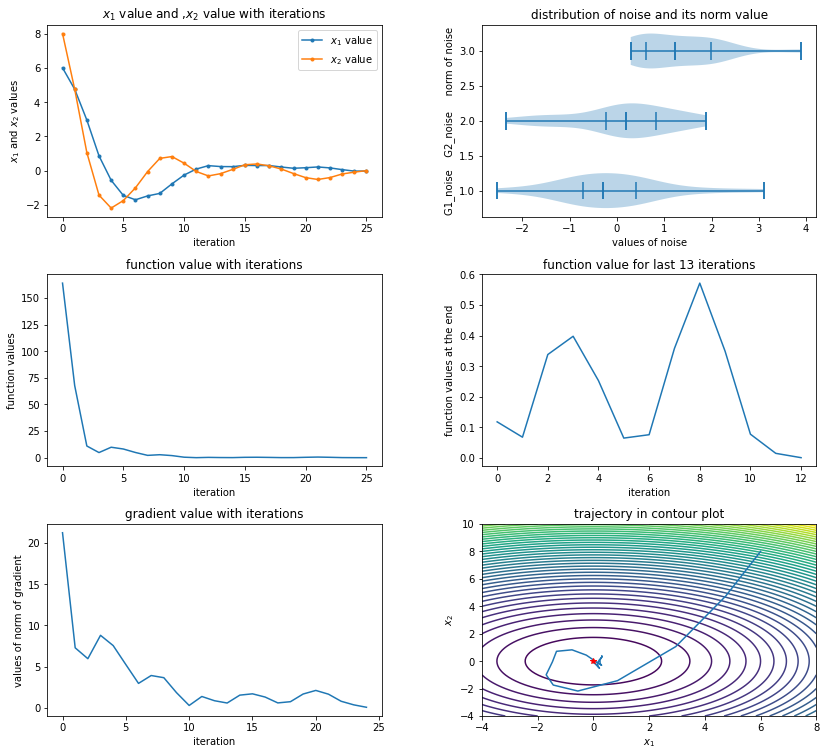

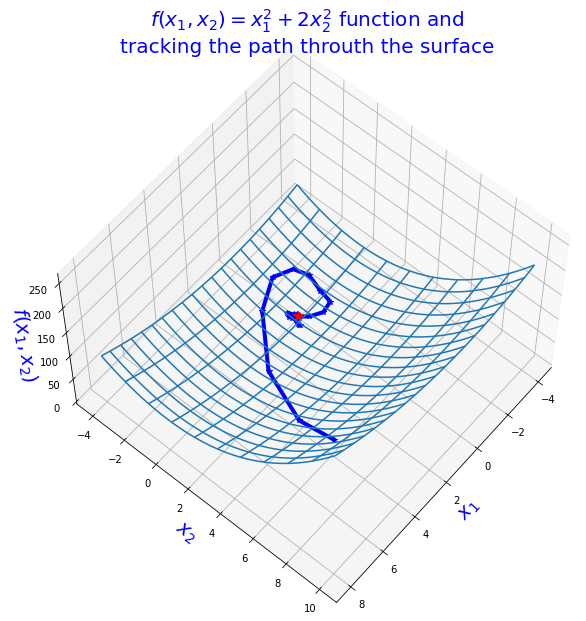

In [123]:
# SGD with momentum of FUNCTION
result_1a=perturbed_GD_momentum([6,8])
all_7_plots(result_1a,Function)

The method used is: constant

Total iteration nedded is   75 to reach 0.001 unit close to minima which is less than the maximum iteration(2000)



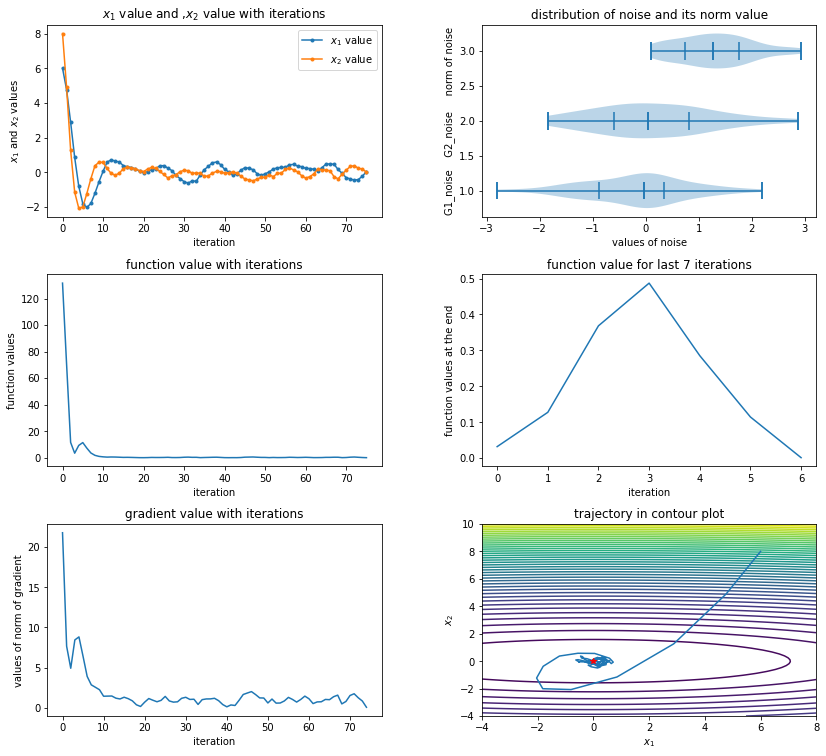

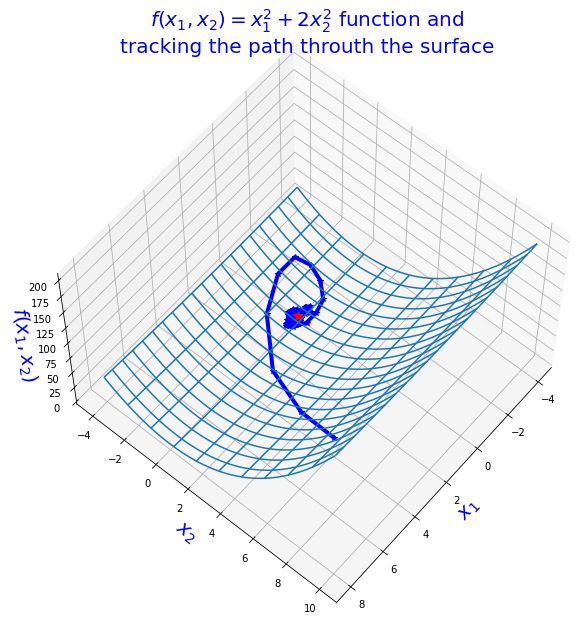

In [125]:
# SGD with momentum of FUNCTION2
result_1a=perturbed_GD_momentum([6,8],F=Function2)
all_7_plots(result_1a,Function2)

## MOMENTUM with MNGD

In [126]:
## All 4 methods are applyed in one function

def perturbed_MBGD_momentum(X=[4,6],no_of_random_no=20,method="constant",F=Function,G=Gradient,mu=0.9,bita=0.1,eta_0=0.1,alpha=0.5,lamda=0.1,max_iteration=2000,Std_Norm_Noise=True,how_close_to_minima=0.001):
    function_values_list=[F(X)]
    x1_values_list=[X[0]]     # values of x coordinate
    x2_values_list=[X[1]]     # values of y coordinate
    eta_values_list=[]        # values of eta ,i.e, Learning Rate of GD
    grad_values_list=[]      # norm values of Gradient at the current point
    noise_G1=[]
    noise_G2=[]
    noise_values_list=[]
    eta=eta_0
    iteration=0
    v=np.asarray([0,0])    
    print("The method used is: {}".format(method))
    while (iteration<= max_iteration): 
        if np.linalg.norm(F(X)-np.asarray([0,0]))>how_close_to_minima:
            iteration+=1
            
            random_x1=0
            random_x2=0
            for i in range(no_of_random_no):
                noise=np.random.randn(2)
                random_x1 += noise[0]
                random_x2 += noise[1]
                
            noise=np.asarray([random_x1/no_of_random_no,random_x2/no_of_random_no])

            v=(mu*v)-eta*(G(X+(mu*v))+noise)
            X+= v   
            
            
#             if Std_Norm_Noise==True:       # if noise is taken from N(0,1)
#                 noise=np.random.randn(2)
#             else:                          # if noise is taken from N(0,0.1) and >0
#                 [[grad_x1_noise,grad_x2_noise]] = np.random.normal(0,0.1, size=(1,2))
#                 noise= np.asarray(np.abs(grad_x1_noise),np.abs(grad_x2_noise))

            noise_G1.append(noise[0])
            noise_G2.append(noise[1])              
            noise_values_list.append(np.linalg.norm(noise))
            grad_values_list.append(np.linalg.norm(G(X)))
            x1_values_list.append(X[0])
            x2_values_list.append(X[1])
            function_values_list.append(Function(X))
        else:
            break
        
        if method=="constant":         # if eta is not changing throughout the iterations
            eta=eta
        if method=="pcwise":           # if eta is decreasing when the function value is increasing 
            if F([x1_values_list[-1],x2_values_list[-1]])-F([x1_values_list[-2],x2_values_list[-2]]) >0:
                eta=eta/2
        if method=="exp":              # if eta is decreasing exponentially  
            eta= eta_0 * np.exp(-lamda*iteration)
        if method=="poly":             # if eta is decreasing polynomially
            eta=eta_0*(1+bita*iteration)**(-alpha)
            
        eta_values_list.append(eta)
        
        
    if iteration< max_iteration:
        print("\nTotal iteration nedded is   {} to reach {} unit close to minima  which is less than the maximum iteration({})\n".format(iteration,how_close_to_minima,max_iteration))
    if iteration>max_iteration:
        print("\nMaximum iteration({}) reached. As you made it stochastic it might not reach the minimum\n".format(max_iteration))
    return x1_values_list , x2_values_list ,function_values_list, eta_values_list ,grad_values_list,noise_G1,noise_G2,noise_values_list


#***************************************************************************************************************
#***************************************************************************************************************

## All 4 methods are applyed in one function

def perturbed_MBGD_momentum2(X=[4,6],no_of_random_no=20,method="constant",F=Function,G=Gradient,mu=0.9,bita=0.1,eta_0=0.1,alpha=0.5,lamda=0.1,max_iteration=2000,Std_Norm_Noise=True,how_close_to_minima=0.001):
    function_values_list=[F(X)]
    x1_values_list=[X[0]]     # values of x coordinate
    x2_values_list=[X[1]]     # values of y coordinate
    eta_values_list=[]        # values of eta ,i.e, Learning Rate of GD
    grad_values_list=[]      # norm values of Gradient at the current point
    noise_G1=[]
    noise_G2=[]
    noise_values_list=[]
    eta=eta_0
    iteration=0
    v=G(X)    
    print("The method used is: {}".format(method))
    while (iteration<= max_iteration): 
        if np.linalg.norm(F(X)-np.asarray([0,0]))>how_close_to_minima:
            iteration+=1
            
            random_x1=0
            random_x2=0
            for i in range(no_of_random_no):
                noise=np.random.randn(2)
                random_x1 += noise[0]
                random_x2 += noise[1]
                
            noise=np.asarray([random_x1/no_of_random_no,random_x2/no_of_random_no])

            X-= eta*v   
            v=(mu*v)+(G(X)+noise)            

            noise_G1.append(noise[0])
            noise_G2.append(noise[1])              
            noise_values_list.append(np.linalg.norm(noise))
            grad_values_list.append(np.linalg.norm(G(X)))
            x1_values_list.append(X[0])
            x2_values_list.append(X[1])
            function_values_list.append(Function(X))
        else:
            break
        
        if method=="constant":         # if eta is not changing throughout the iterations
            eta=eta
        if method=="pcwise":           # if eta is decreasing when the function value is increasing 
            if F([x1_values_list[-1],x2_values_list[-1]])-F([x1_values_list[-2],x2_values_list[-2]]) >0:
                eta=eta/2
        if method=="exp":              # if eta is decreasing exponentially  
            eta= eta_0 * np.exp(-lamda*iteration)
        if method=="poly":             # if eta is decreasing polynomially
            eta=eta_0*(1+bita*iteration)**(-alpha)
            
        eta_values_list.append(eta)
        
        
    if iteration< max_iteration:
        print("\nTotal iteration nedded is   {} to reach {} unit close to minima  which is less than the maximum iteration({})\n".format(iteration,how_close_to_minima,max_iteration))
    if iteration>max_iteration:
        print("\nMaximum iteration({}) reached. As you made it stochastic it might not reach the minimum\n".format(max_iteration))
    return x1_values_list , x2_values_list ,function_values_list, eta_values_list ,grad_values_list,noise_G1,noise_G2,noise_values_list


### SGD with momentum of FUNCTION            change eta and see the effect

The method used is: constant

Total iteration nedded is   34 to reach 0.001 unit close to minima  which is less than the maximum iteration(2000)



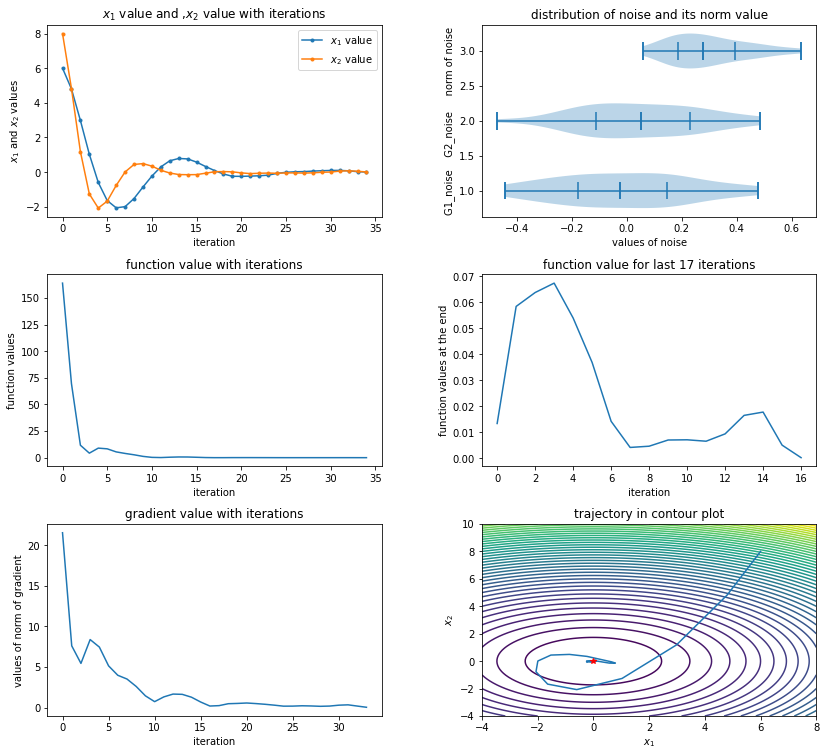

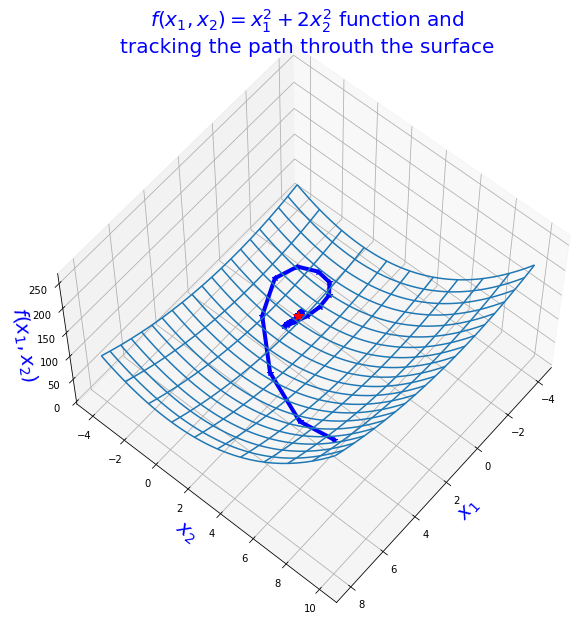

In [129]:
# perturbed_MBGD_momentum
result_1a=perturbed_MBGD_momentum([6,8])
all_7_plots(result_1a,Function)

The method used is: constant

Total iteration nedded is   91 to reach 0.001 unit close to minima  which is less than the maximum iteration(2000)



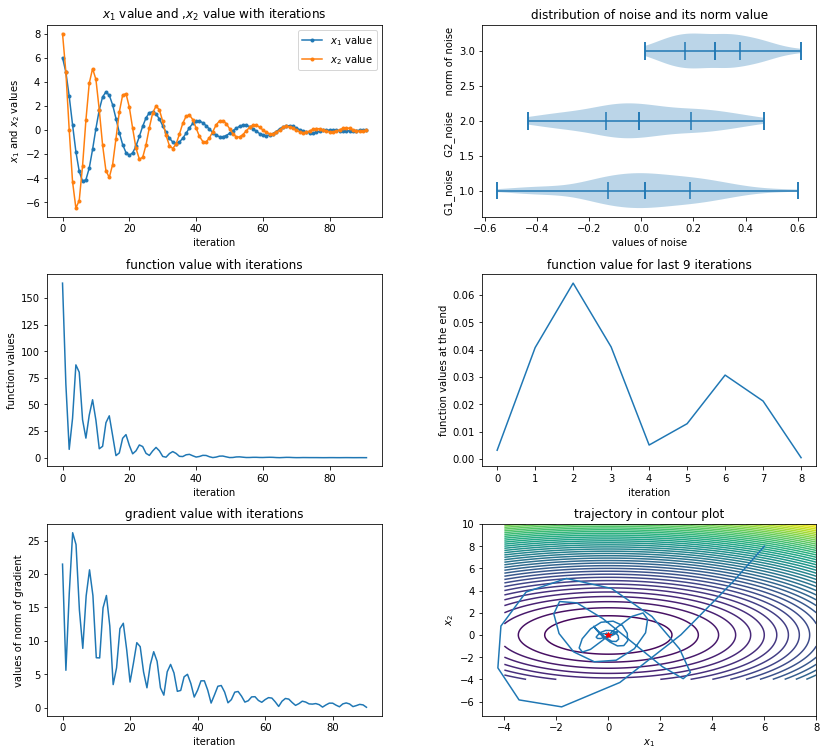

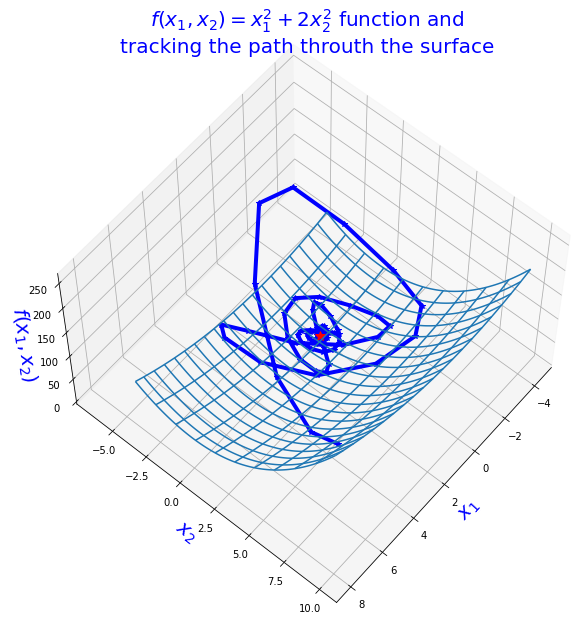

In [130]:
# perturbed_MBGD_momentum2
result_1a=perturbed_MBGD_momentum2([6,8])
all_7_plots(result_1a,Function)

The method used is: constant

Total iteration nedded is   104 to reach 0.001 unit close to minima  which is less than the maximum iteration(2000)



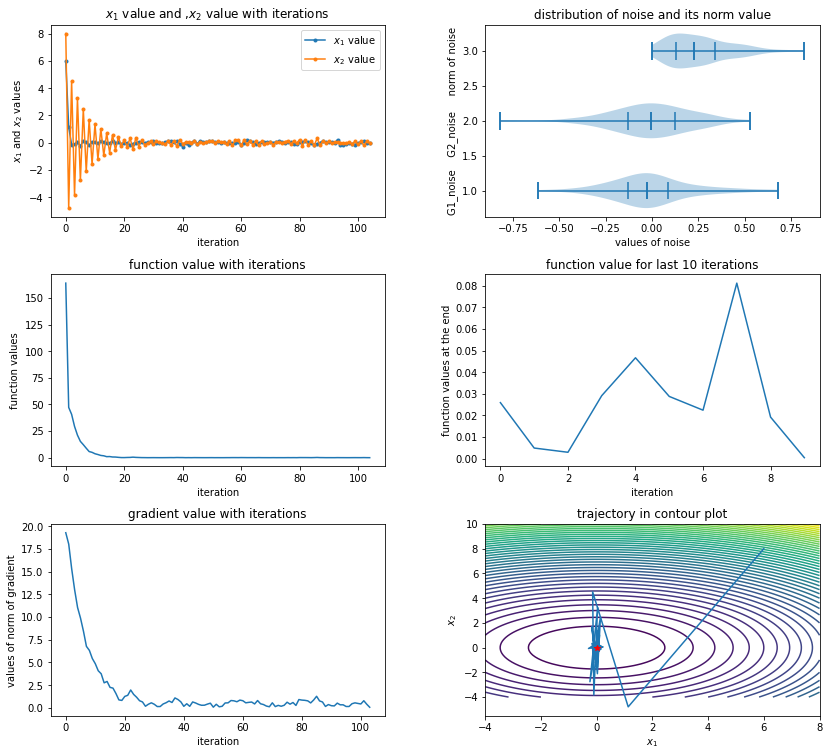

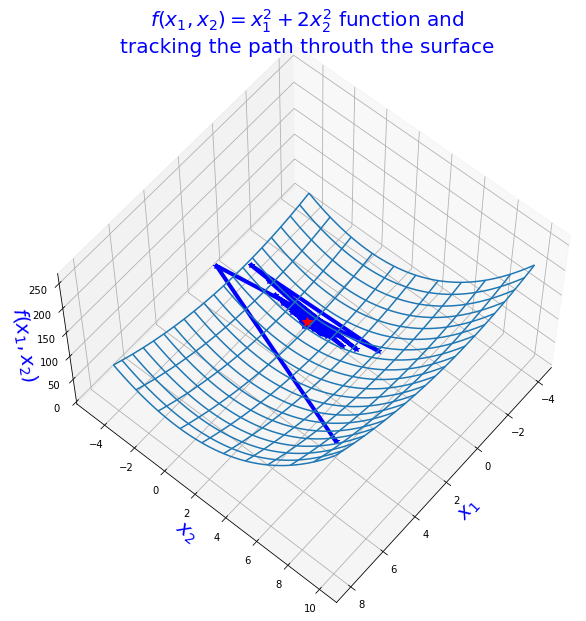

In [131]:
# perturbed_MBGD_momentum           removee eta
result_1a=perturbed_MBGD_momentum([6,8],mu=0.2,eta_0=0.4)
all_7_plots(result_1a,Function)

The method used is: constant

Total iteration nedded is   30 to reach 0.001 unit close to minima  which is less than the maximum iteration(2000)



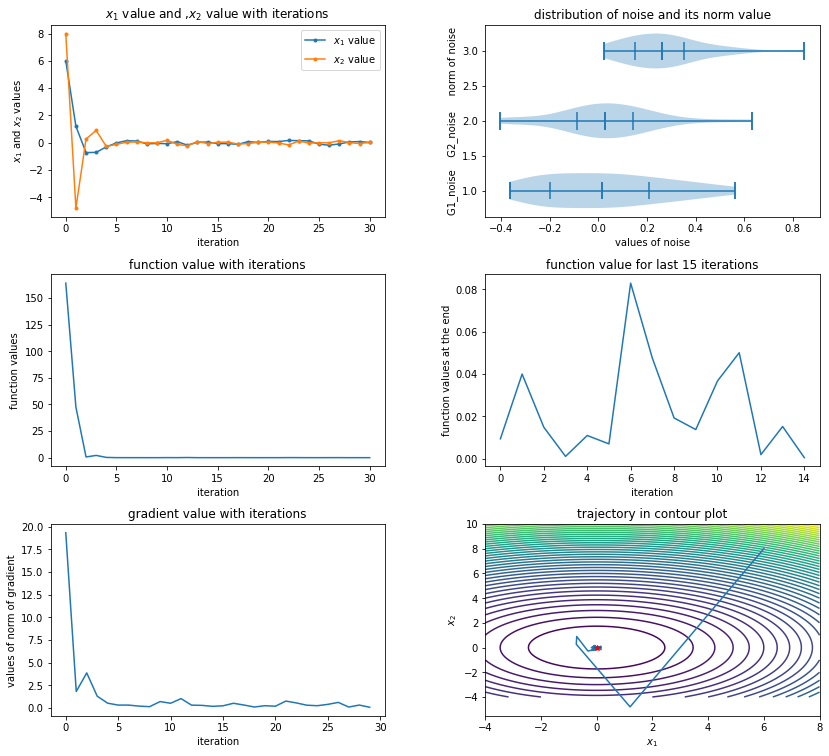

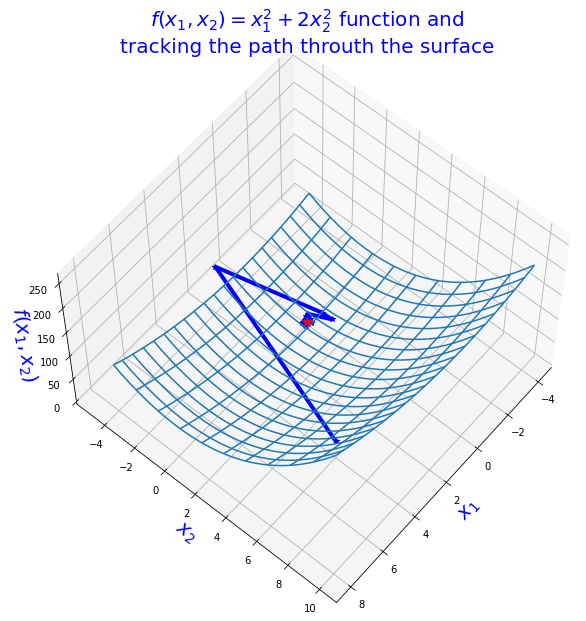

In [132]:
# perturbed_MBGD_momentum2            removee eta
result_1a=perturbed_MBGD_momentum2([6,8],mu=0.2,eta_0=0.4)
all_7_plots(result_1a,Function)

### SGD with momentum of FUNCTION2            change eta and see the effect

The method used is: constant

Total iteration nedded is   25 to reach 0.001 unit close to minima  which is less than the maximum iteration(2000)



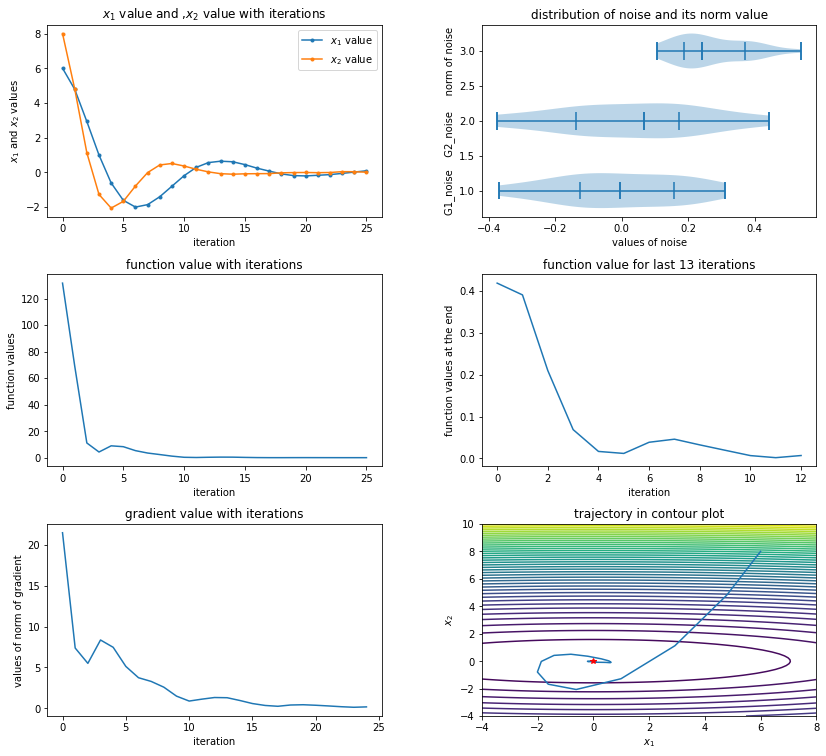

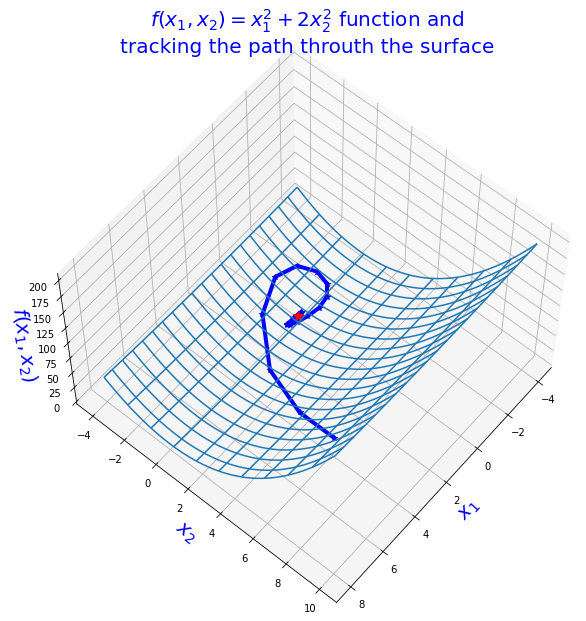

In [133]:
# perturbed_MBGD_momentum            ,mu=0.9
result_1a=perturbed_MBGD_momentum([6,8],F=Function2)
all_7_plots(result_1a,Function2)

The method used is: constant

Total iteration nedded is   59 to reach 0.001 unit close to minima  which is less than the maximum iteration(2000)



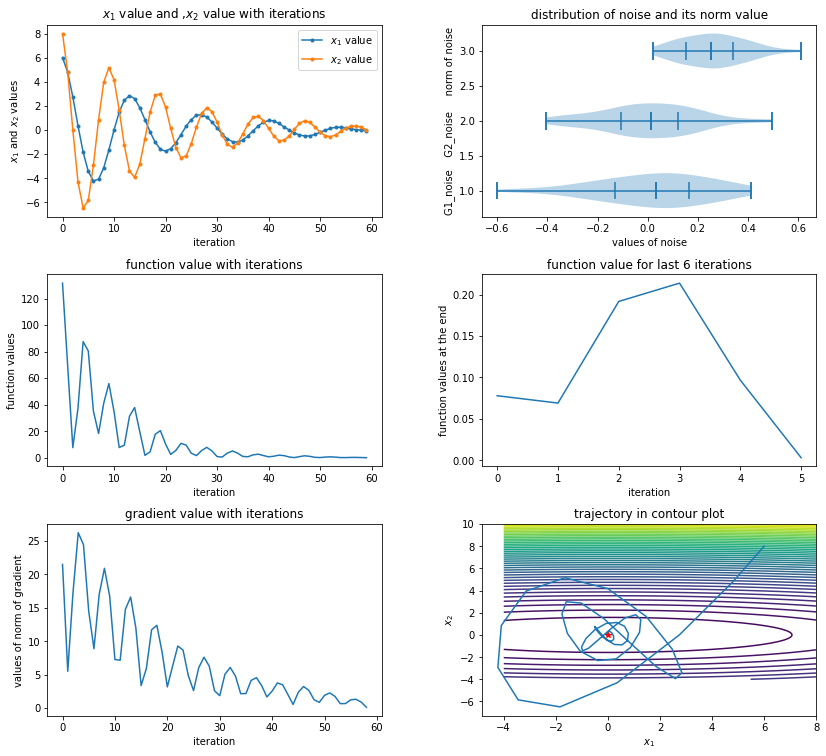

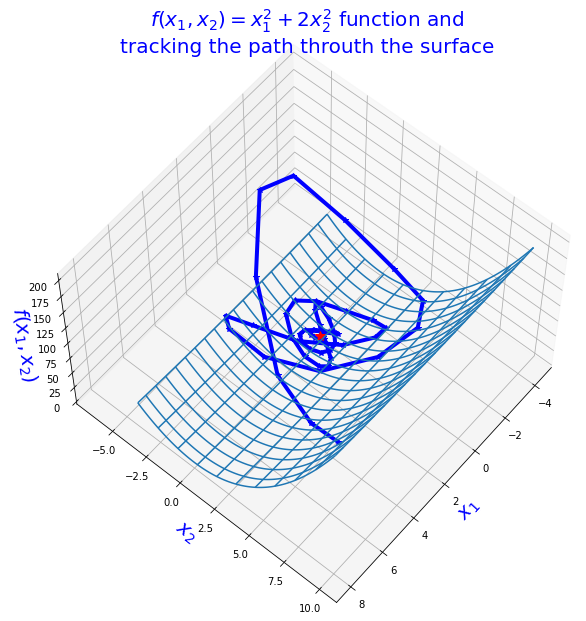

In [134]:
# perturbed_MBGD_momentum2           ,mu=0.9
result_1a=perturbed_MBGD_momentum2([6,8],F=Function2)
all_7_plots(result_1a,Function2)

The method used is: constant

Total iteration nedded is   15 to reach 0.001 unit close to minima  which is less than the maximum iteration(2000)



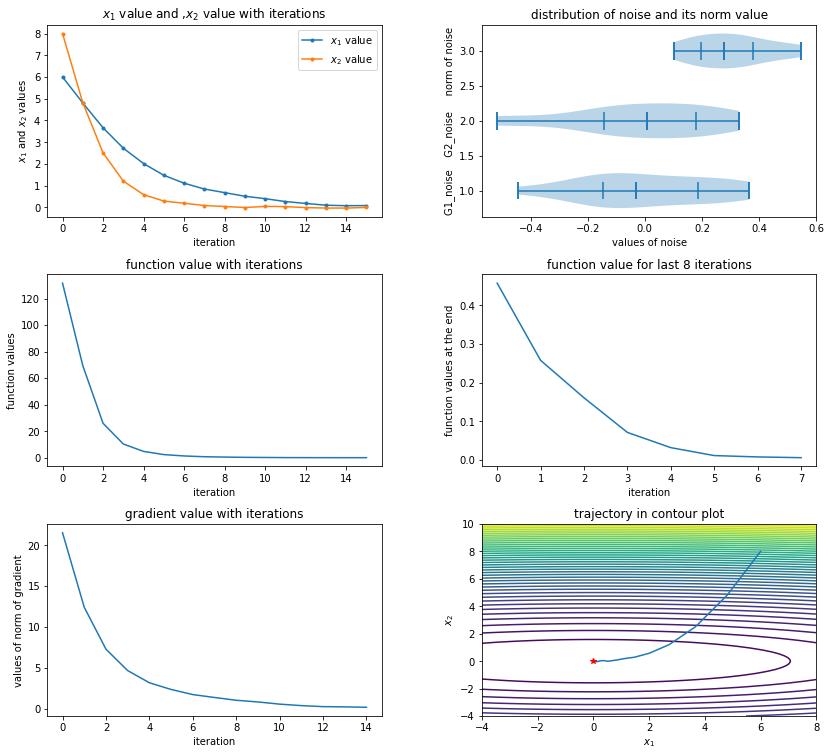

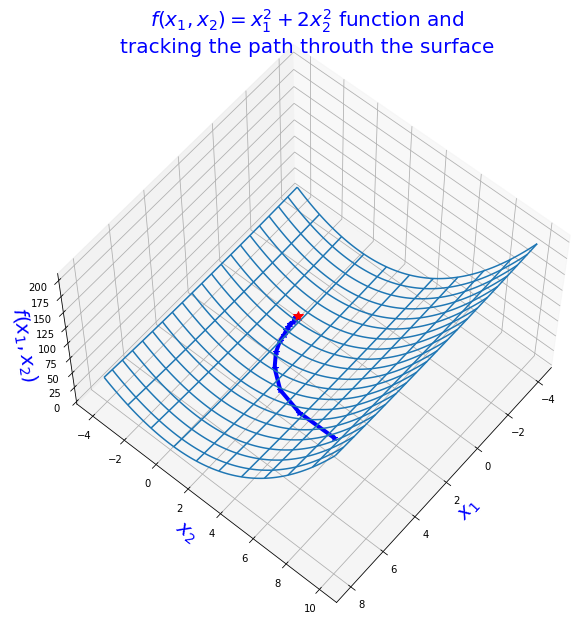

In [135]:
# perturbed_MBGD_momentum           ,mu=0.2
result_1a=perturbed_MBGD_momentum([6,8],F=Function2,mu=0.2)
all_7_plots(result_1a,Function2)

The method used is: constant

Total iteration nedded is   18 to reach 0.001 unit close to minima  which is less than the maximum iteration(2000)



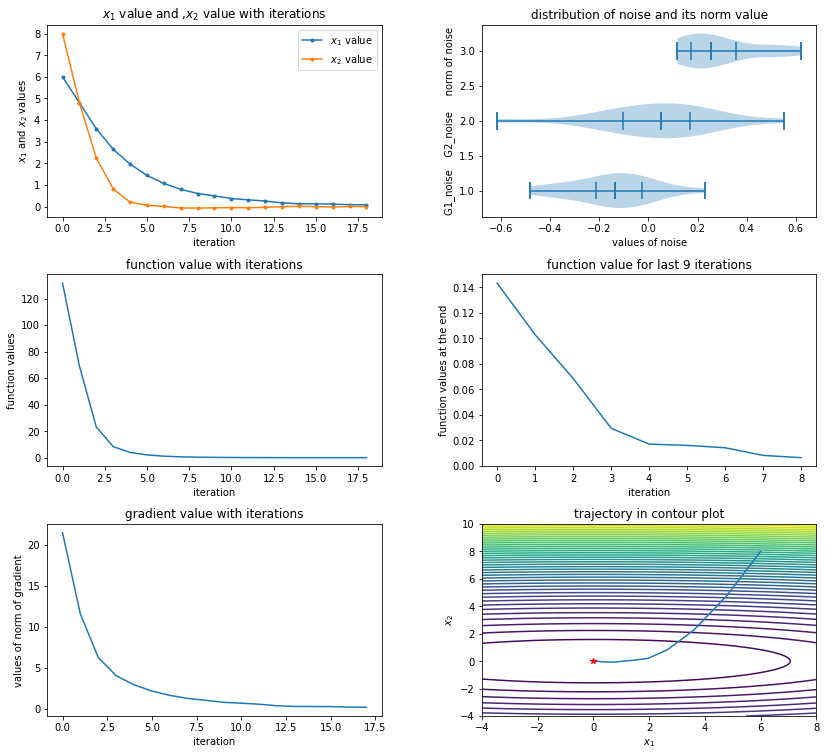

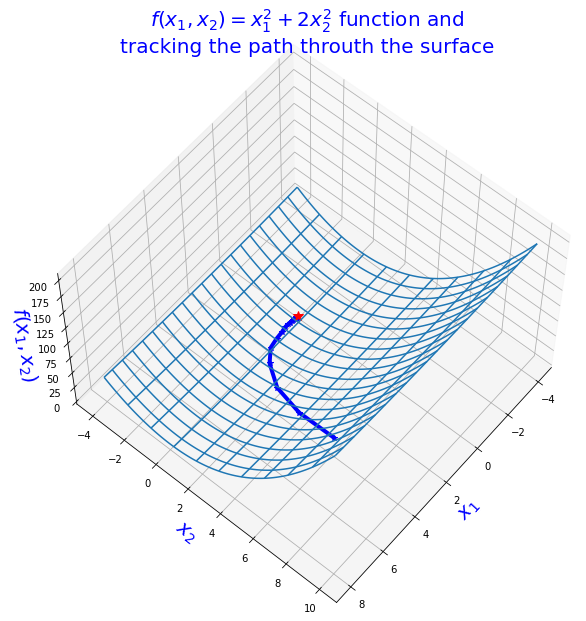

In [136]:
# perturbed_MBGD_momentum2       ,mu=0.2
result_1a=perturbed_MBGD_momentum2([6,8],F=Function2,mu=0.2)
all_7_plots(result_1a,Function2)

## The non convex function

In [137]:
# Required Libraries 
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from mpl_toolkits import mplot3d
%matplotlib inline 

def Function1(X):
    x1=X[0]
    x2=X[1]
    return x1**2 - 2*(x2**2)
def Gradient1(X):
    x1=X[0]
    x2=X[1]
    return np.asarray([2*x1 , (-4)*x2])

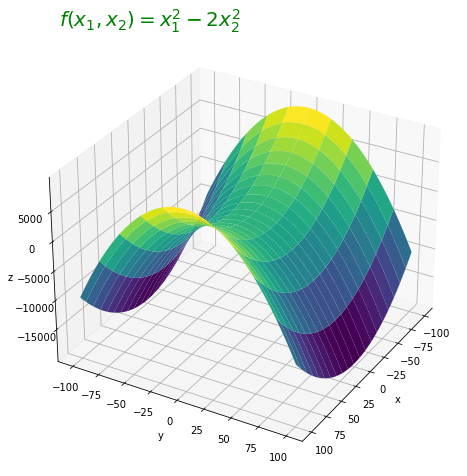

In [138]:
a=b=np.linspace(-100,100,100)
c,d=np.meshgrid(a,b)
z=Function1((c,d))

plt.figure(figsize=(8,8))
ax=plt.axes(projection="3d")
ax.plot_surface(c,d,z,cstride=5,cmap="viridis")
ax.set_xlabel("x")
ax.set_ylabel("y")
ax.set_zlabel("z")
ax.set_title("$ f(x_1, x_2) =  x_1^2 -2 x_2^2 $ ",fontdict={ "fontsize": 20 , "color": "green" , "horizontalalignment":"right"})
ax.view_init(30,30)

In [139]:
def plot_3D_plot(result,Function=Function):
    lower_x=-40
    higher_x=max(result[0])+2
    lower_y=-40
    higher_y=max(result[1])+2
    a=np.linspace(lower_x,higher_x,100)
    b=np.linspace(lower_y,higher_y,100)
#     a=np.linspace(-10,15,100)
#     b=np.linspace(-10,15,100)
    c,d=np.meshgrid(a,b)
    z=Function((c,d))
    plt.figure(figsize=(10,10))
    ax=plt.axes(projection="3d")
    
#     ax.plot_wireframe(c,d,z,rstride=10, cstride=5,cmap="gray")#,color="gray"),
    ax.contour3D(c,d,z,100,cmap="viridis"),
    ax.view_init(60,40),
    ax.plot3D(result[0],result[1],result[2],"b*-", linewidth=4),
#     ax.plot_surface(result[0],result[1],result[2],cmap='viridish'),
    ax.plot3D(0,0,0,"r*-", markersize=10),
    # ax.scatter(result[0],result[1],result[2], c='red', s=100),
    ax.set_xlabel("$x_1$",fontdict={ "fontsize": 20 , "color": "blue" }),
    ax.set_ylabel("$x_2$",fontdict={ "fontsize": 20 , "color": "blue" }),
    ax.set_zlabel("$ f(x_1,x_2)$",fontdict={ "fontsize": 20 , "color": "blue" }),
    ax.set_title("$ f(x_1, x_2) =  x_1^2 +2 x_2^2 $ function and \ntracking the path throuth the surface",fontdict={ "fontsize": 20 , "color": "blue" , "horizontalalignment":"center"}),

    
    return plt.show()


def all_7_plots(result,Function=Function):
    plt.figure(figsize=(12,12))
    
    plt.subplot(321)
    plt.plot(result[0],".-",label="$x_1$ value")
    plt.plot(result[1],".-",label="$x_2$ value")
    plt.title("$x_1$ value and ,$x_2$ value with iterations")
    plt.xlabel("iteration")
    plt.ylabel("$x_1$ and $x_2$ values")
    plt.legend()

    plt.subplot(322)
    data=pd.DataFrame({"G1_noise":result[5],"G2_noise":result[6],"norm of noise":result[7]})
    plt.violinplot(data,positions=None, vert=False, widths=0.5, showmeans=False, showextrema=True, showmedians=True,  quantiles=[[0,0.25,0.5,0.75,1],[0,0.25,0.5,0.75,1],[0,0.25,0.5,0.75,1]], points=100, bw_method=None, data=None)
#     sns.displot(data,  x=result[5], y=result[6],kind="kde", rug=True)
#     plt.plot(result[5],".-",label="$G_1 noise$ value")
#     plt.plot(result[6],".-",label="$G_2 noise$ value")
#     plt.plot(result[7],".-",label="norm of noise")
    plt.title("distribution of noise and its norm value")
    plt.xlabel("values of noise")
    plt.ylabel("G1_noise    G2_noise     norm of noise") 
#     plt.legend()
    
    plt.subplot(323)
    plt.plot(result[2])
    plt.title("function value with iterations")
    plt.xlabel("iteration")
    plt.ylabel("function values")

    plt.subplot(324)
    if len(result[2])<50:
        last=np.int(len(result[2])/2)
    else:
        last=np.int(len(result[2])/10)
    plt.plot(result[2][-last:])
    plt.title("function value for last {} iterations".format(last))
    plt.xlabel("iteration")
    plt.ylabel("function values at the end")


    plt.subplot(325)
    plt.plot(result[4])
    plt.title("gradient value with iterations")
    plt.xlabel("iteration")
    plt.ylabel("values of norm of gradient")

    plt.subplot(326)
    lower_x=-4
    higher_x=max(result[0])+2
    lower_y=-4
    higher_y=max(result[1])+2
    a=np.linspace(lower_x,higher_x,100)
    b=np.linspace(lower_y,higher_y,100)
    c,d=np.meshgrid(a,b)
    z=Function((c,d))
    plt.contour(c,d,z,50)
    plt.plot(result[0],result[1])
    plt.plot(0,0,"r*")
    plt.title("trajectory in contour plot")
    plt.xlabel("$x_1$")
    plt.ylabel("$x_2$")

    plt.subplots_adjust(left=0.01,bottom=0.1, right=0.9, top=0.9, wspace=0.3, hspace=0.3)
    
    plot_3D_plot(result,Function)
    return plt.show()


In [140]:
## All 4 methods are applyed in one function

def perturbed_MBGD_momentum(X=[4,6],no_of_random_no=20,method="constant",F=Function,G=Gradient,mu=0.9,bita=0.1,eta_0=0.1,alpha=0.5,lamda=0.1,max_iteration=2000,Std_Norm_Noise=True,how_close_to_minima=0.001):
    function_values_list=[F(X)]
    x1_values_list=[X[0]]     # values of x coordinate
    x2_values_list=[X[1]]     # values of y coordinate
    eta_values_list=[]        # values of eta ,i.e, Learning Rate of GD
    grad_values_list=[]      # norm values of Gradient at the current point
    noise_G1=[]
    noise_G2=[]
    noise_values_list=[]
    eta=eta_0
    iteration=0
    v=np.asarray([0,0])    
    print("The method used is: {}".format(method))
    while (iteration<= max_iteration): 
        if np.linalg.norm(F(X)-np.asarray([0,0]))>how_close_to_minima:
            iteration+=1
            
            random_x1=0
            random_x2=0
            for i in range(no_of_random_no):
                noise=np.random.randn(2)
                random_x1 += noise[0]
                random_x2 += noise[1]
                
            noise=np.asarray([random_x1/no_of_random_no,random_x2/no_of_random_no])

            v=(mu*v)-eta*(G(X+(mu*v))+noise)
            X+= v   
            
            noise_G1.append(noise[0])
            noise_G2.append(noise[1])              
            noise_values_list.append(np.linalg.norm(noise))
            grad_values_list.append(np.linalg.norm(G(X)))
            x1_values_list.append(X[0])
            x2_values_list.append(X[1])
            function_values_list.append(Function(X))
        else:
            break
        
        if method=="constant":         # if eta is not changing throughout the iterations
            eta=eta
        if method=="pcwise":           # if eta is decreasing when the function value is increasing 
            if F([x1_values_list[-1],x2_values_list[-1]])-F([x1_values_list[-2],x2_values_list[-2]]) >0:
                eta=eta/2
        if method=="exp":              # if eta is decreasing exponentially  
            eta= eta_0 * np.exp(-lamda*iteration)
        if method=="poly":             # if eta is decreasing polynomially
            eta=eta_0*(1+bita*iteration)**(-alpha)
            
        eta_values_list.append(eta)
        
        
    if iteration< max_iteration:
        print("\nTotal iteration nedded is   {} to reach {} unit close to minima  which is less than the maximum iteration({})\n".format(iteration,how_close_to_minima,max_iteration))
    if iteration>max_iteration:
        print("\nMaximum iteration({}) reached. As you made it stochastic it might not reach the minimum\n".format(max_iteration))
    return x1_values_list , x2_values_list ,function_values_list, eta_values_list ,grad_values_list,noise_G1,noise_G2,noise_values_list


#***************************************************************************************************************
#***************************************************************************************************************

## All 4 methods are applyed in one function

def perturbed_MBGD_momentum2(X=[4,6],no_of_random_no=20,method="constant",F=Function1,G=Gradient1,mu=0.9,bita=0.1,eta_0=0.1,alpha=0.5,lamda=0.1,max_iteration=2000,Std_Norm_Noise=True,how_close_to_minima=0.001):
    function_values_list=[F(X)]
    x1_values_list=[X[0]]     # values of x coordinate
    x2_values_list=[X[1]]     # values of y coordinate
    eta_values_list=[]        # values of eta ,i.e, Learning Rate of GD
    grad_values_list=[]      # norm values of Gradient at the current point
    noise_G1=[]
    noise_G2=[]
    noise_values_list=[]
    eta=eta_0
    iteration=0
    v=G(X)    
    print("The method used is: {}".format(method))
    while (iteration<= max_iteration): 
        if np.linalg.norm(F(X)-np.asarray([0,0]))>how_close_to_minima:
            iteration+=1
            
            random_x1=0
            random_x2=0
            for i in range(no_of_random_no):
                noise=np.random.randn(2)
                random_x1 += noise[0]
                random_x2 += noise[1]
                
            noise=np.asarray([random_x1/no_of_random_no,random_x2/no_of_random_no])

            X-= eta*v   
            v=(mu*v)+(G(X)+noise)            

            noise_G1.append(noise[0])
            noise_G2.append(noise[1])              
            noise_values_list.append(np.linalg.norm(noise))
            grad_values_list.append(np.linalg.norm(G(X)))
            x1_values_list.append(X[0])
            x2_values_list.append(X[1])
            function_values_list.append(Function(X))
        else:
            break
        
        if method=="constant":         # if eta is not changing throughout the iterations
            eta=eta
        if method=="pcwise":           # if eta is decreasing when the function value is increasing 
            if F([x1_values_list[-1],x2_values_list[-1]])-F([x1_values_list[-2],x2_values_list[-2]]) >0:
                eta=eta/2
        if method=="exp":              # if eta is decreasing exponentially  
            eta= eta_0 * np.exp(-lamda*iteration)
        if method=="poly":             # if eta is decreasing polynomially
            eta=eta_0*(1+bita*iteration)**(-alpha)
            
        eta_values_list.append(eta)
        
        
    if iteration< max_iteration:
        print("\nTotal iteration nedded is   {} to reach {} unit close to minima  which is less than the maximum iteration({})\n".format(iteration,how_close_to_minima,max_iteration))
    if iteration>max_iteration:
        print("\nMaximum iteration({}) reached. As you made it stochastic it might not reach the minimum\n".format(max_iteration))
    return x1_values_list , x2_values_list ,function_values_list, eta_values_list ,grad_values_list,noise_G1,noise_G2,noise_values_list


In [141]:
def plot_3D_plot(result,Function):
#     lower_x=-40
    higher_x=max(result[0])+2
    lower_x=- higher_x/2   
#     lower_y=-40
    higher_y=max(result[1])+2
    lower_y=- higher_y/2
    a=np.linspace(lower_x,higher_x,100)
    b=np.linspace(lower_y,higher_y,100)
#     a=np.linspace(-10,15,100)
#     b=np.linspace(-10,15,100)
    c,d=np.meshgrid(a,b)
    z=Function((c,d))
    plt.figure(figsize=(10,10))
    ax=plt.axes(projection="3d")
    
#     ax.plot_wireframe(c,d,z,rstride=10, cstride=5,cmap="gray")#,color="gray"),
    ax.contour3D(c,d,z,100,cmap="viridis"),
    ax.view_init(0,90),
    ax.plot3D(result[0],result[1],result[2],"b*-", linewidth=4),
    ax.plot3D(0,0,0,"r*-", markersize=10),
    # ax.scatter(result[0],result[1],result[2], c='red', s=100),
    ax.set_xlabel("$x_1$",fontdict={ "fontsize": 20 , "color": "blue" }),
    ax.set_ylabel("$x_2$",fontdict={ "fontsize": 20 , "color": "blue" }),
    ax.set_zlabel("$ f(x_1,x_2)$",fontdict={ "fontsize": 20 , "color": "blue" }),
    ax.set_title("$ f(x_1, x_2) =  x_1^2 +2 x_2^2 $ function and \ntracking the path throuth the surface",fontdict={ "fontsize": 20 , "color": "blue" , "horizontalalignment":"center"}),

    
    return plt.show()


def all_7_plots(result,Function=Function):
    plt.figure(figsize=(12,12))
    
    plt.subplot(321)
    plt.plot(result[0],".-",label="$x_1$ value")
    plt.plot(result[1],".-",label="$x_2$ value")
    plt.title("$x_1$ value and ,$x_2$ value with iterations")
    plt.xlabel("iteration")
    plt.ylabel("$x_1$ and $x_2$ values")
    plt.legend()

    plt.subplot(322)
    data=pd.DataFrame({"G1_noise":result[5],"G2_noise":result[6],"norm of noise":result[7]})
    plt.violinplot(data,positions=None, vert=False, widths=0.5, showmeans=False, showextrema=True, showmedians=True,  quantiles=[[0,0.25,0.5,0.75,1],[0,0.25,0.5,0.75,1],[0,0.25,0.5,0.75,1]], points=100, bw_method=None, data=None)
#     sns.displot(data,  x=result[5], y=result[6],kind="kde", rug=True)
#     plt.plot(result[5],".-",label="$G_1 noise$ value")
#     plt.plot(result[6],".-",label="$G_2 noise$ value")
#     plt.plot(result[7],".-",label="norm of noise")
    plt.title("distribution of noise and its norm value")
    plt.xlabel("values of noise")
    plt.ylabel("G1_noise    G2_noise     norm of noise") 
#     plt.legend()
    
    plt.subplot(323)
    plt.plot(result[2])
    plt.title("function value with iterations")
    plt.xlabel("iteration")
    plt.ylabel("function values")

    plt.subplot(324)
    if len(result[2])<50:
        last=np.int(len(result[2])/2)
    else:
        last=np.int(len(result[2])/10)
    plt.plot(result[2][-last:])
    plt.title("function value for last {} iterations".format(last))
    plt.xlabel("iteration")
    plt.ylabel("function values at the end")


    plt.subplot(325)
    plt.plot(result[4])
    plt.title("gradient value with iterations")
    plt.xlabel("iteration")
    plt.ylabel("values of norm of gradient")

    plt.subplot(326)
    lower_x=-4
    higher_x=max(result[0])+2
    lower_y=-4
    higher_y=max(result[1])+2
    a=np.linspace(lower_x,higher_x,100)
    b=np.linspace(lower_y,higher_y,100)
    c,d=np.meshgrid(a,b)
    z=Function((c,d))
    plt.contour(c,d,z,50)
    plt.plot(result[0],result[1])
    plt.plot(0,0,"r*")
    plt.title("trajectory in contour plot")
    plt.xlabel("$x_1$")
    plt.ylabel("$x_2$")

    plt.subplots_adjust(left=0.01,bottom=0.1, right=0.9, top=0.9, wspace=0.3, hspace=0.3)
    
    plot_3D_plot(result,Function)
    return plt.show()


The method used is: constant

Maximum iteration(2000) reached. As you made it stochastic it might not reach the minimum



<ipython-input-98-34a93b3f855f>:15: RuntimeWarning: overflow encountered in double_scalars
  return x1**2 +2*(x2**2)
<ipython-input-137-8ae660f0bfa9>:12: RuntimeWarning: overflow encountered in double_scalars
  return x1**2 - 2*(x2**2)
<ipython-input-140-fb674e9e07d9>:94: RuntimeWarning: overflow encountered in add
  v=(mu*v)+(G(X)+noise)
/home/sysadm/anaconda3/lib/python3.8/site-packages/numpy/core/function_base.py:144: RuntimeWarning: invalid value encountered in multiply
  y *= step
/home/sysadm/anaconda3/lib/python3.8/site-packages/matplotlib/contour.py:1494: UserWarning: Warning: converting a masked element to nan.
  self.zmax = float(z.max())
/home/sysadm/anaconda3/lib/python3.8/site-packages/matplotlib/contour.py:1495: UserWarning: Warning: converting a masked element to nan.
  self.zmin = float(z.min())
<ipython-input-141-eac05ed26db1>:87: UserWarning: No contour levels were found within the data range.
  plt.contour(c,d,z,50)
/home/sysadm/anaconda3/lib/python3.8/site-packages/

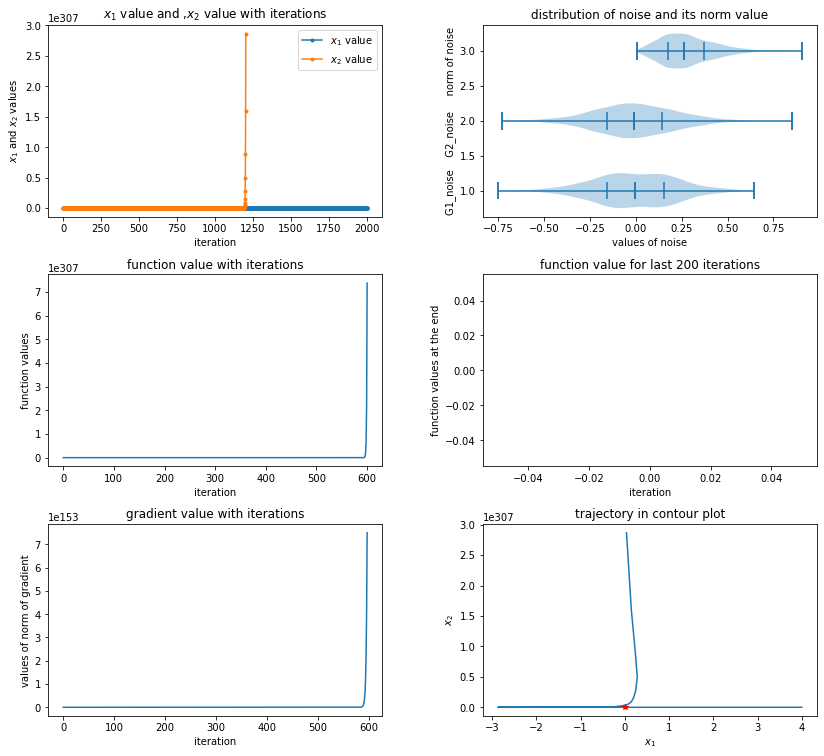

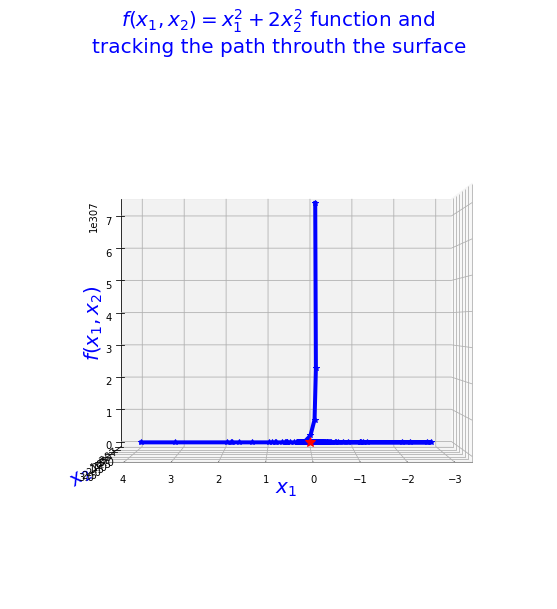

In [142]:
# perturbed_MBGD_momentum            ,mu=0.9
result_1a=perturbed_MBGD_momentum2(X=[4,6],eta_0=0.1,mu=0.9,F=Function1,G=Gradient1,no_of_random_no=20)
# result_1a=perturbed_MBGD_momentum([6,8],F=Function2)
all_7_plots(result_1a,Function1)


In [147]:
# perturbed_MBGD_momentum            ,mu=0.9
result_1a=perturbed_MBGD_momentum(X=[0.2,6],eta_0=0.01,mu=0.48,F=Function1,G=Gradient1,no_of_random_no=20,method="constant",bita=0.1,alpha=0.5,lamda=0.1,max_iteration=20,Std_Norm_Noise=True,how_close_to_minima=0.001)
# result_1a=perturbed_MBGD_momentum([6,8],F=Function2)
# all_7_plots(result_1a,Function1)


The method used is: constant

Maximum iteration(20) reached. As you made it stochastic it might not reach the minimum



In [148]:
result_1a

([0.2,
  0.1934699087480597,
  0.18670071288436182,
  0.1779057151812808,
  0.1684654800506327,
  0.1633767932998465,
  0.1558123461103005,
  0.14992568205931264,
  0.1481212698920143,
  0.14505664319363806,
  0.1398047580812579,
  0.13468643566205107,
  0.1317729245251689,
  0.1281630320428163,
  0.12551330507476766,
  0.12336573913025817,
  0.11615561887753033,
  0.10700485166377333,
  0.10099071699808815,
  0.09426464883629518,
  0.08707809510253871,
  0.08002489086703568],
 [6,
  6.2422128587315395,
  6.614148432565088,
  7.0662697019871485,
  7.578710468471223,
  8.137176142493866,
  8.741786235941287,
  9.39322704055682,
  10.09338854766178,
  10.84673576457304,
  11.657976438667351,
  12.529935633189753,
  13.467880579342008,
  14.474467814870783,
  15.551361589971126,
  16.71034075532581,
  17.95908571081531,
  19.29968537916832,
  20.744906888873786,
  22.29528170884436,
  23.96161260922495,
  25.752667529338794],
 [-71.96,
  77.96787335301774,
  87.52877613219795,
  99.895985

# Interactive cell and plot